# ST1504 Deep Learning — CA2 Part A: Image Generation with GAN/VAE on CIFAR-10

**Module:** ST1504 Deep Learning &nbsp;|&nbsp; **Course:** DAAA &nbsp;|&nbsp; **Semester:** AY2026/27 Semester 1

**Team Members:** *Ephraim, P2510666* and *Han Qian, P2508526* and *Zheng Hao, P2510848*


In [1]:
import tensorflow as tf
tf.config.list_physical_devices()

c:\Users\ephra\anaconda3\envs\gpu_env\lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:


from tensorflow.keras.datasets import cifar10

from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Conv2DTranspose, Embedding, Concatenate
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU, ReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam

import matplotlib.pyplot as plt

import sys
import os

import numpy as np


# fix random seeds for reproducibility of our experiments
np.random.seed(42)
tf.random.set_seed(42)


# Exploratory Data Analysis (EDA) & Feature Engineering



In [4]:
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
X_train_scaled = X_train.astype('float32') / 255  # CHANGED: rescale once here so every model's train() can reuse it instead of re-loading/re-downloading per run

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

print("X_train shape:", X_train.shape)   # expect (50000, 32, 32, 3)
print("y_train shape:", y_train.shape)   # expect (50000, 1)
print("X_test  shape:", X_test.shape)    # expect (10000, 32, 32, 3)
print("dtype:", X_train.dtype)
print("pixel value range: min =", X_train.min(), ", max =", X_train.max())

X_train shape: (50000, 32, 32, 3)
y_train shape: (50000, 1)
X_test  shape: (10000, 32, 32, 3)
dtype: uint8
pixel value range: min = 0 , max = 255


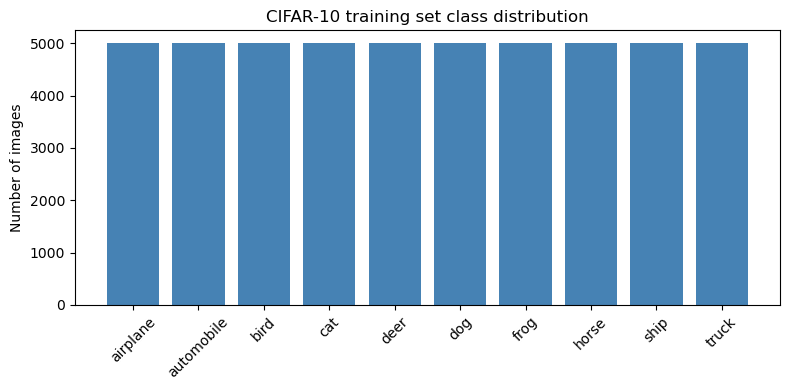

{'airplane': 5000, 'automobile': 5000, 'bird': 5000, 'cat': 5000, 'deer': 5000, 'dog': 5000, 'frog': 5000, 'horse': 5000, 'ship': 5000, 'truck': 5000}


In [5]:
# Class balance check — is any class over/under-represented?
unique, counts = np.unique(y_train, return_counts=True)

plt.figure(figsize=(8, 4))
plt.bar([class_names[u] for u in unique], counts, color='steelblue')
plt.title('CIFAR-10 training set class distribution')
plt.ylabel('Number of images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(dict(zip([class_names[u] for u in unique], counts)))

 (1) a single unconditional GAN gets equal "pressure"
from every class



 (2) the conditional GAN in Section 9 will not be biased towards any
class, so generating 100 images per class is fair.

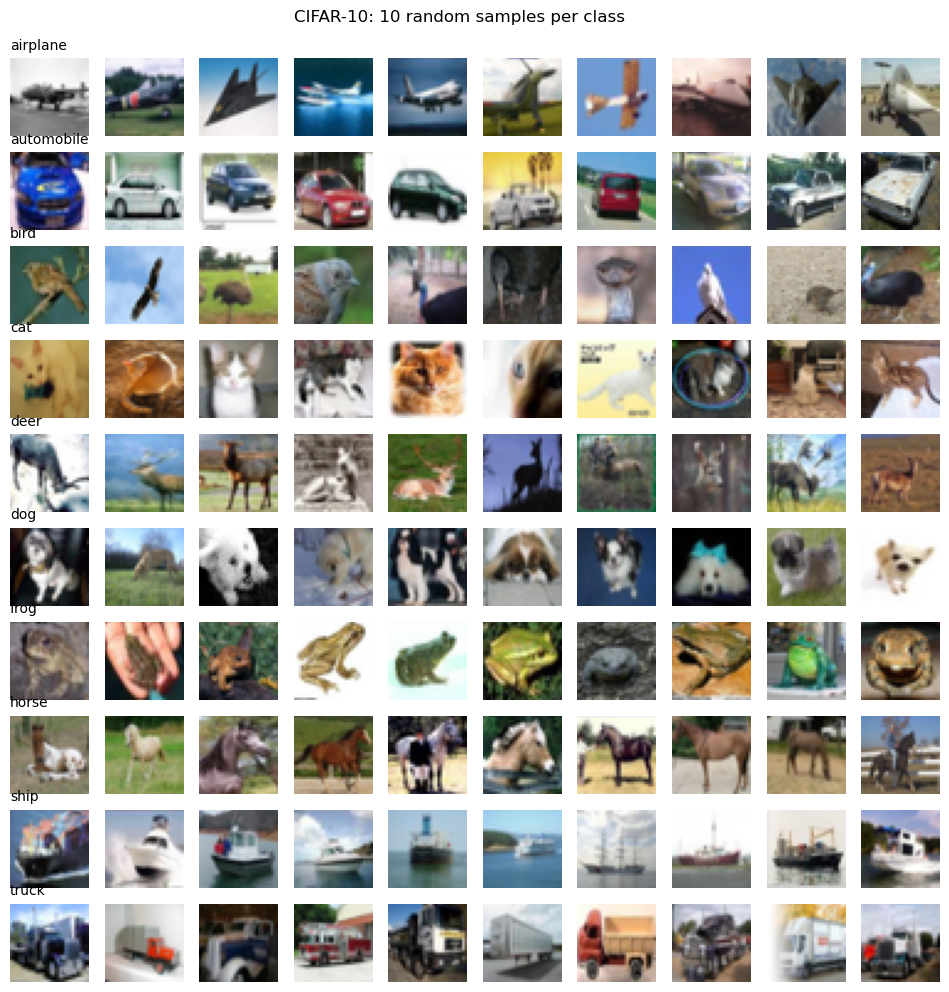

In [6]:
# Visual inspection: 10 random samples from each of the 10 classes
fig, axs = plt.subplots(10, 10, figsize=(12, 12))
for row in range(10):
    idx = np.where(y_train.flatten() == row)[0]
    chosen = np.random.choice(idx, 10, replace=False)
    for col in range(10):
        axs[row, col].imshow(X_train[chosen[col]])
        axs[row, col].axis('off')
        if col == 0:
            axs[row, col].set_title(class_names[row], loc='left', fontsize=10)
plt.suptitle('CIFAR-10: 10 random samples per class', y=0.92)
plt.show()

Red   channel: mean = 0.491, std = 0.247
Green channel: mean = 0.482, std = 0.243
Blue  channel: mean = 0.447, std = 0.262


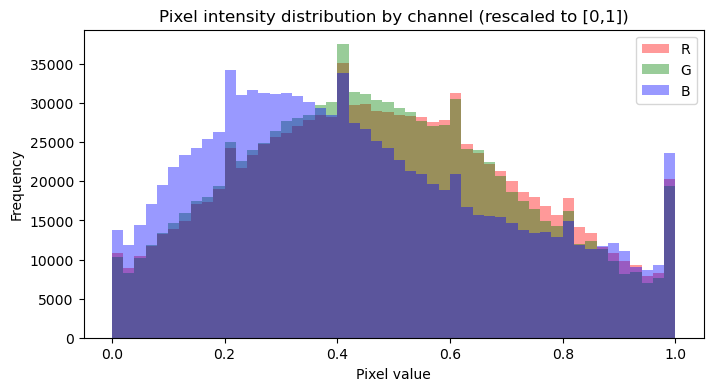

In [7]:
# Pixel intensity statistics per channel — informs output activation choice
X_float = X_train.astype('float32') / 255.0
for ch, name in enumerate(['Red', 'Green', 'Blue']):
    print(f"{name:5s} channel: mean = {X_float[:, :, :, ch].mean():.3f}, "
          f"std = {X_float[:, :, :, ch].std():.3f}")

plt.figure(figsize=(8, 4))
for ch, (name, colour) in enumerate(zip(['R', 'G', 'B'], ['red', 'green', 'blue'])):
    plt.hist(X_float[::50, :, :, ch].ravel(), bins=50, alpha=0.4, color=colour, label=name)
plt.title('Pixel intensity distribution by channel (rescaled to [0,1])')
plt.xlabel('Pixel value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

The RGB pixel values are spread across the full range, with similar distributions across all three colour channels. This shows CIFAR-10 images contain varied colour information, so scaling pixels to [0, 1] and using a sigmoid generator output is appropriate.


# GAN: Baseline DCGAN


In [8]:
class DCGAN():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        # CHANGED (our addition): keep loss histories so we can plot training dynamics later
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):

        model = Sequential(name='Generator')

        model.add(Dense(128 * 8 * 8, activation="relu", input_dim=self.latent_dim))  # CHANGED: 7*7 -> 8*8 (CIFAR-10 is 32x32, not 28x28)
        model.add(Reshape((8, 8, 128)))  # CHANGED: (7, 7, 128) -> (8, 8, 128)
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))  # CHANGED: Conv2DTranspose instead of UpSampling2D+Conv2D, upsample to 16x16
        model.add(ReLU())  # TUNING CHANGE: DCGAN paper uses plain ReLU in the generator (LeakyReLU is reserved for the discriminator)
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))  # upsample to 32x32 (was 28x28)
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))  # CHANGED: sigmoid + [0,1] normalization instead of tanh + [-1,1]

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(ReLU())  # TUNING CHANGE: ReLU takes no alpha kwarg -- fixed, and swapped from LeakyReLU per your request
        model.add(Dropout(0.2))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(ReLU())  # TUNING CHANGE: ReLU takes no alpha kwarg -- fixed, and swapped from LeakyReLU per your request
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        # Load the dataset
        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run
        # CHANGED: np.expand_dims removed - CIFAR-10 is already (N, 32, 32, 3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        # CHANGED (our addition): 'epoch' now means one full pass over the dataset (as the name implies),
        # not one mini-batch -- the original loop trained on a single random batch per 'epoch', so
        # epochs=1000 was really only ~2.6 real passes over the 50,000 training images
        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])  # CHANGED: shuffle once per epoch -- sample the whole dataset without replacement, once per pass
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                # ---------------------
                #  Train Discriminator
                # ---------------------

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                # Sample noise and generate a batch of new images
                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()  # CHANGED: direct call instead of .predict() -- .predict() rebuilds prediction-loop overhead on every call, leaking memory over thousands of iterations

                # Train the discriminator (real classified as ones and generated as zeros)
                d_loss_real = self.discriminator.train_on_batch(imgs, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                # ---------------------
                #  Train Generator
                # ---------------------

                # Train the generator (wants discriminator to mistake images as real)
                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            # Plot the progress -- averaged over this epoch's steps_per_epoch batches
            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            # CHANGED (our addition): record losses for later analysis
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            # CHANGED (our addition): print a row of generated images every 10 epochs for quick visual feedback
            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            # If at save interval => save generated image samples
            if epoch % save_interval == 0 or epoch == epochs - 1:  # also capture the FINAL epoch, not just multiples of save_interval
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)  # CHANGED: already sigmoid/[0,1], no rescale needed (lab used tanh -> 0.5*x+0.5)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])  # CHANGED: colour image, no [:,:,0] slice / cmap
                axs[i,j].axis('off')
                cnt += 1
        output_dir = getattr(self, 'output_dir', 'generated_cifar10_baseline')
        os.makedirs(output_dir, exist_ok=True)
        fig.savefig(f"{output_dir}/dcgan_cifar10_{epoch:d}.png")
        plt.close()

    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    # CHANGED (our addition): plot the recorded training dynamics
    def plot_losses(self, title='DCGAN training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Iteration'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Iteration'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()


# Baseline Generator
The generator takes a 100-dimensional random noise vector as input. A dense layer expands this noise into an 8×8×128 feature map. Two transposed convolution layers then upsample the feature map from 8×8 to 16×16 and finally to 32×32. ReLU activations help the generator learn complex visual features. The final convolution layer outputs a 32×32 RGB image, while the sigmoid activation constrains pixel values to the range 0 to 1, matching the normalised CIFAR-10 images.
# Baseline Discriminator
The discriminator receives a 32×32 RGB image and predicts whether it is real or generated. Two convolution layers progressively reduce the image size while learning visual features such as colours, edges, and shapes. ReLU activations introduce non-linearity, while dropout (0.2) reduces overfitting by randomly disabling some neurons during training. The learned feature maps are flattened and passed to a final sigmoid output layer, which produces a probability between 0 and 1: close to 1 means the image is likely real, while close to 0 means it is likely generated.

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 128)       3584      
                                                                 
 re_lu (ReLU)                (None, 16, 16, 128)       0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 128)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 re_lu_1 (ReLU)              (None, 8, 8, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)            

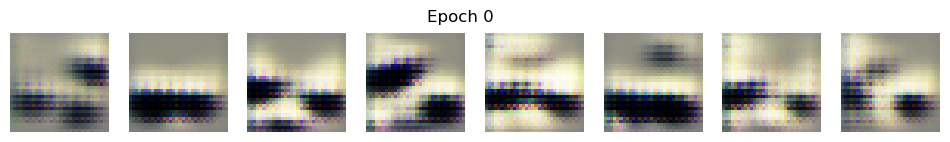

1 [D loss: 0.694297, acc.: 49.74%] [G loss: 0.759294]
2 [D loss: 0.691097, acc.: 51.87%] [G loss: 0.723971]
3 [D loss: 0.688482, acc.: 53.22%] [G loss: 0.732905]
4 [D loss: 0.684997, acc.: 54.39%] [G loss: 0.728139]
5 [D loss: 0.680201, acc.: 54.64%] [G loss: 0.768300]
6 [D loss: 0.673676, acc.: 58.02%] [G loss: 0.772277]
7 [D loss: 0.688235, acc.: 52.49%] [G loss: 0.772681]
8 [D loss: 0.687836, acc.: 53.47%] [G loss: 0.733239]
9 [D loss: 0.690618, acc.: 52.00%] [G loss: 0.719449]
10 [D loss: 0.693717, acc.: 48.94%] [G loss: 0.708705]


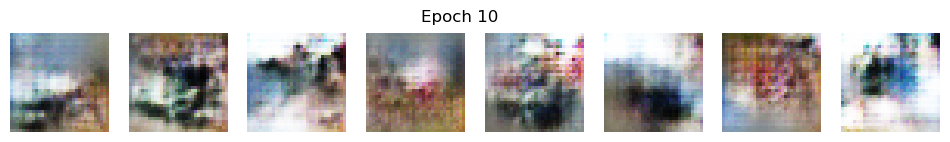

11 [D loss: 0.693899, acc.: 47.32%] [G loss: 0.697365]
12 [D loss: 0.692653, acc.: 49.59%] [G loss: 0.704681]
13 [D loss: 0.691943, acc.: 51.52%] [G loss: 0.705460]
14 [D loss: 0.690108, acc.: 52.54%] [G loss: 0.708790]
15 [D loss: 0.690286, acc.: 51.30%] [G loss: 0.720389]
16 [D loss: 0.689784, acc.: 51.93%] [G loss: 0.712912]
17 [D loss: 0.691457, acc.: 50.62%] [G loss: 0.714790]
18 [D loss: 0.690793, acc.: 50.50%] [G loss: 0.708529]
19 [D loss: 0.691039, acc.: 50.38%] [G loss: 0.707033]
20 [D loss: 0.691341, acc.: 50.26%] [G loss: 0.707067]


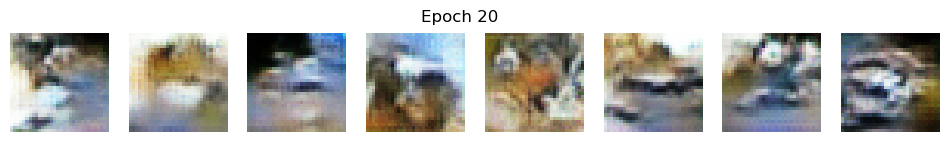

21 [D loss: 0.691033, acc.: 50.58%] [G loss: 0.703125]
22 [D loss: 0.690428, acc.: 51.28%] [G loss: 0.708556]
23 [D loss: 0.690604, acc.: 51.25%] [G loss: 0.712785]
24 [D loss: 0.691168, acc.: 51.11%] [G loss: 0.710576]
25 [D loss: 0.691095, acc.: 50.45%] [G loss: 0.708103]
26 [D loss: 0.690991, acc.: 50.55%] [G loss: 0.710285]
27 [D loss: 0.690887, acc.: 50.57%] [G loss: 0.710967]
28 [D loss: 0.690883, acc.: 51.16%] [G loss: 0.712193]
29 [D loss: 0.690306, acc.: 51.02%] [G loss: 0.714422]


In [9]:
dcgan = DCGAN(32, 32, 3)  # CHANGED: (28, 28, 1) -> (32, 32, 3)
dcgan.train(epochs=30, batch_size=128, save_interval=10)


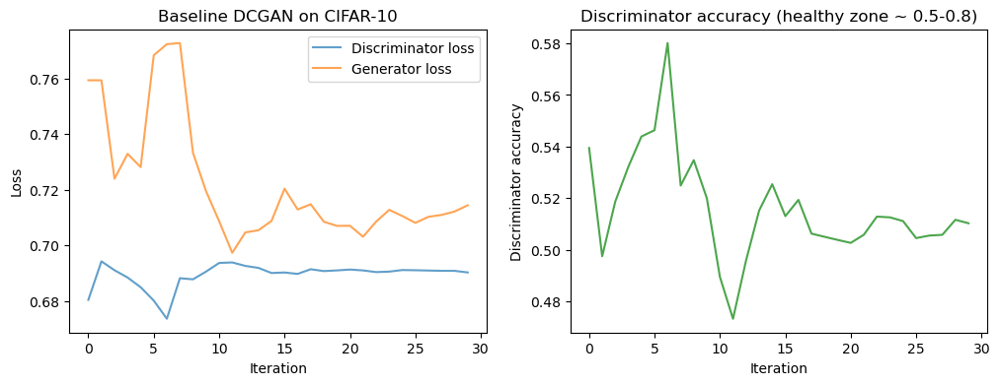

In [10]:
dcgan.plot_losses('Baseline DCGAN on CIFAR-10')

# save baseline weights for reproducibility
dcgan.generator.save_weights('weights/dcgan_baseline_generator.h5')
dcgan.discriminator.save_weights('weights/dcgan_baseline_discriminator.h5')

### Baseline training interpretation

The discriminator and generator losses remain relatively stable throughout training. 

At epoch 29, the discriminator loss is 0.690 with 51.02% accuracy, meaning it is only slightly better than random guessing at distinguishing real and generated images. The generator loss is 0.714, which is also stable.

Overall, neither model is dominating the other, so the baseline training appears balanced.

### Eye-power check: baseline vs real images

Rather than judging the generator's output in isolation, we put real CIFAR-10 photos from the test dataset
directly next to the model's own generated samples, fresh random real images and a fresh
noise draw every time this cell runs, so the comparison is always against actual data.

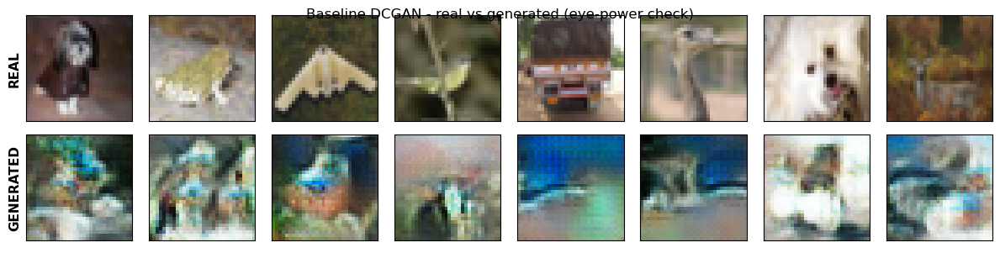

In [11]:
# CHANGED (our addition): compare generated images directly against real CIFAR-10 photos,
# not in isolation -- this is what an eye-power/'does it look real' check actually needs.
def real_vs_fake_grid(generator, real_images, real_labels=None, class_names=None,
                      latent_dim=100, n=8, seed=7, title='Real vs generated'):
    """Display real CIFAR-10 images above generated images.

    Pass real_labels for a conditional generator; its fakes will use the
    matching labels so every column compares the same requested class.
    """
    rng = np.random.RandomState(seed)
    real_idx = rng.choice(real_images.shape[0], n, replace=False)
    real_imgs = real_images[real_idx].astype('float32') / 255

    noise = rng.normal(0, 1, (n, latent_dim))
    if real_labels is None:
        gen_imgs = generator(noise, training=False).numpy()
        selected_labels = None
    else:
        selected_labels = np.asarray(real_labels).reshape(-1)[real_idx]
        gen_imgs = generator.predict([noise, selected_labels.reshape(-1, 1)], verbose=0)

    fig, axs = plt.subplots(2, n, figsize=(n * 1.5, 3))
    for i in range(n):
        axs[0, i].imshow(real_imgs[i])
        axs[0, i].set_xticks([]); axs[0, i].set_yticks([])
        if selected_labels is not None and class_names is not None:
            axs[0, i].set_title(class_names[selected_labels[i]], fontsize=8)
        axs[1, i].imshow(gen_imgs[i])
        axs[1, i].set_xticks([]); axs[1, i].set_yticks([])
    axs[0, 0].set_ylabel('REAL', fontsize=11, fontweight='bold')
    axs[1, 0].set_ylabel('GENERATED', fontsize=11, fontweight='bold')
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()
    return fig

_ = real_vs_fake_grid(dcgan.generator, X_test, title='Baseline DCGAN - real vs generated (eye-power check)')

Quite blurry images, but visible shape. If we let it train for longer, might show more significant results

# Manual Hyperparameter Tuning (Runs v1 – v10)





## Model v1 — baseline architecture, 60 epochs

v1 repeats the original baseline architecture and hyperparameters exactly, but trains for 60 epochs rather than 30. 

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 16, 16, 128)       3584      
                                                                 
 re_lu_8 (ReLU)              (None, 16, 16, 128)       0         
                                                                 
 dropout_4 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 re_lu_9 (ReLU)              (None, 8, 8, 128)         0         
                                                                 
 dropout_5 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 8192)            

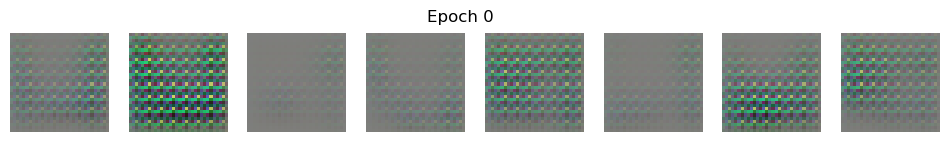

1 [D loss: 0.676742, acc.: 54.58%] [G loss: 0.771666]
2 [D loss: 0.683159, acc.: 55.63%] [G loss: 0.737220]
3 [D loss: 0.691892, acc.: 49.75%] [G loss: 0.727598]
4 [D loss: 0.690954, acc.: 51.69%] [G loss: 0.705902]
5 [D loss: 0.690738, acc.: 50.87%] [G loss: 0.712520]
6 [D loss: 0.690495, acc.: 52.02%] [G loss: 0.742597]
7 [D loss: 0.681984, acc.: 55.49%] [G loss: 0.765063]
8 [D loss: 0.682839, acc.: 55.32%] [G loss: 0.769576]
9 [D loss: 0.685009, acc.: 54.18%] [G loss: 0.762228]
10 [D loss: 0.687946, acc.: 53.20%] [G loss: 0.766110]


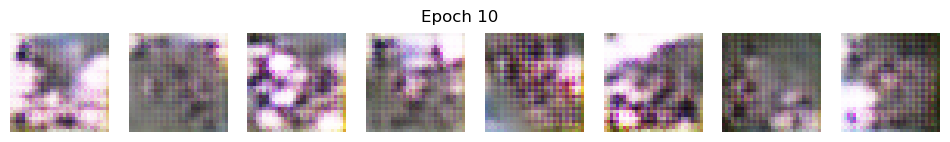

11 [D loss: 0.685925, acc.: 52.62%] [G loss: 0.753959]
12 [D loss: 0.685077, acc.: 54.89%] [G loss: 0.743016]
13 [D loss: 0.689278, acc.: 52.92%] [G loss: 0.738422]
14 [D loss: 0.693361, acc.: 49.12%] [G loss: 0.711736]
15 [D loss: 0.694106, acc.: 48.07%] [G loss: 0.707586]
16 [D loss: 0.692175, acc.: 50.28%] [G loss: 0.707431]
17 [D loss: 0.691589, acc.: 51.93%] [G loss: 0.712794]
18 [D loss: 0.690778, acc.: 50.95%] [G loss: 0.713459]
19 [D loss: 0.690654, acc.: 50.50%] [G loss: 0.714341]
20 [D loss: 0.691057, acc.: 50.85%] [G loss: 0.713030]


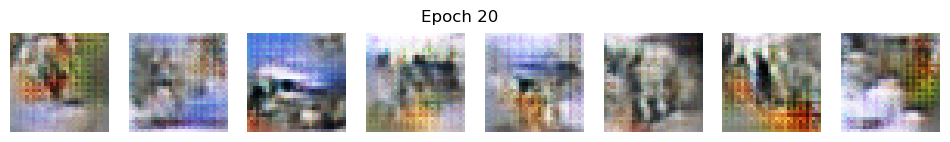

21 [D loss: 0.692033, acc.: 49.25%] [G loss: 0.704363]
22 [D loss: 0.691707, acc.: 49.39%] [G loss: 0.706504]
23 [D loss: 0.692450, acc.: 49.68%] [G loss: 0.705705]
24 [D loss: 0.690886, acc.: 51.27%] [G loss: 0.706017]
25 [D loss: 0.691660, acc.: 50.70%] [G loss: 0.704919]
26 [D loss: 0.691257, acc.: 50.68%] [G loss: 0.705556]
27 [D loss: 0.691608, acc.: 50.53%] [G loss: 0.709523]
28 [D loss: 0.691915, acc.: 50.45%] [G loss: 0.708233]
29 [D loss: 0.691416, acc.: 50.50%] [G loss: 0.708298]
30 [D loss: 0.691273, acc.: 50.22%] [G loss: 0.709573]


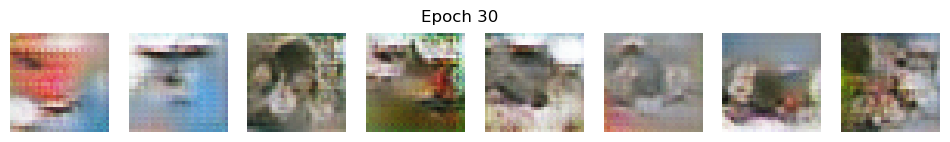

31 [D loss: 0.691363, acc.: 50.21%] [G loss: 0.707807]
32 [D loss: 0.690575, acc.: 51.31%] [G loss: 0.708623]
33 [D loss: 0.691174, acc.: 50.23%] [G loss: 0.710422]
34 [D loss: 0.690885, acc.: 50.86%] [G loss: 0.711056]
35 [D loss: 0.690793, acc.: 50.41%] [G loss: 0.712564]
36 [D loss: 0.690528, acc.: 50.90%] [G loss: 0.708128]
37 [D loss: 0.690444, acc.: 50.34%] [G loss: 0.708685]
38 [D loss: 0.690101, acc.: 51.19%] [G loss: 0.708428]
39 [D loss: 0.690681, acc.: 50.25%] [G loss: 0.707600]
40 [D loss: 0.690670, acc.: 51.04%] [G loss: 0.706451]


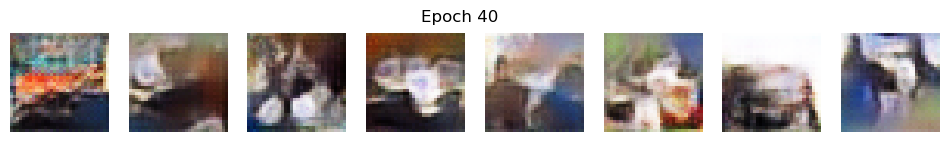

41 [D loss: 0.690657, acc.: 50.78%] [G loss: 0.706933]
42 [D loss: 0.691412, acc.: 50.29%] [G loss: 0.707217]
43 [D loss: 0.690876, acc.: 51.11%] [G loss: 0.707692]
44 [D loss: 0.690343, acc.: 51.51%] [G loss: 0.707260]
45 [D loss: 0.690921, acc.: 51.27%] [G loss: 0.705118]
46 [D loss: 0.690924, acc.: 50.99%] [G loss: 0.705526]
47 [D loss: 0.690793, acc.: 51.46%] [G loss: 0.705521]
48 [D loss: 0.690909, acc.: 51.24%] [G loss: 0.705228]
49 [D loss: 0.691212, acc.: 51.13%] [G loss: 0.706722]
50 [D loss: 0.691796, acc.: 50.52%] [G loss: 0.706555]


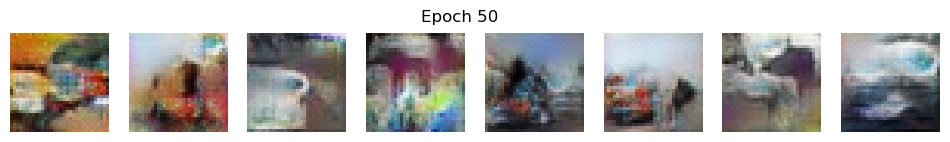

51 [D loss: 0.691407, acc.: 50.94%] [G loss: 0.706673]
52 [D loss: 0.691392, acc.: 51.04%] [G loss: 0.706655]
53 [D loss: 0.691703, acc.: 50.98%] [G loss: 0.706106]
54 [D loss: 0.691992, acc.: 50.62%] [G loss: 0.706463]
55 [D loss: 0.691908, acc.: 50.78%] [G loss: 0.705687]
56 [D loss: 0.692001, acc.: 50.62%] [G loss: 0.706062]
57 [D loss: 0.691815, acc.: 50.74%] [G loss: 0.706128]
58 [D loss: 0.692066, acc.: 50.54%] [G loss: 0.704874]
59 [D loss: 0.691964, acc.: 50.81%] [G loss: 0.705114]


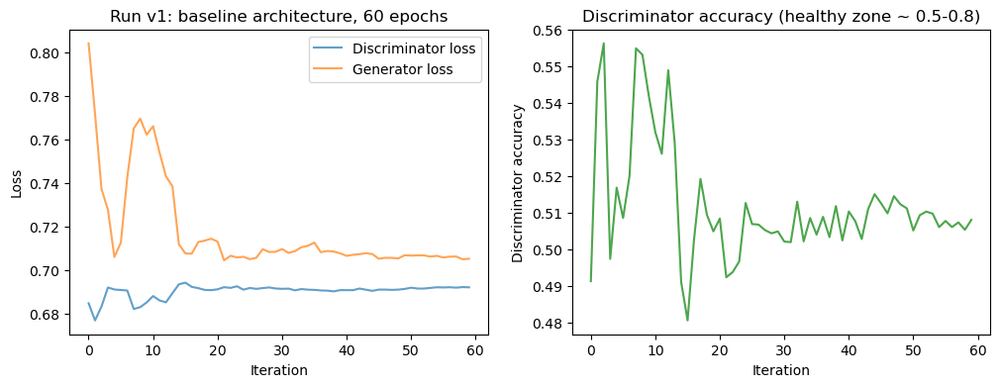

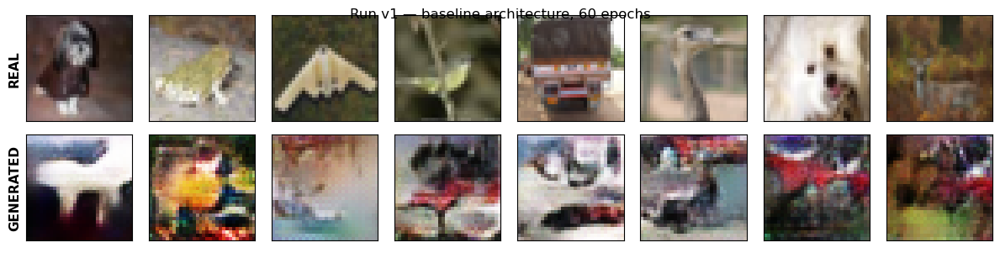

In [14]:
# v1: same architecture and learning rates as the 30-epoch baseline, trained for 60 epochs
dcgan_v1 = DCGAN(32, 32, 3)
dcgan_v1.output_dir = 'generated_cifar10_v1'
dcgan_v1.train(epochs=60, batch_size=128, save_interval=10)
dcgan_v1.plot_losses('Run v1: baseline architecture, 60 epochs')
dcgan_v1.generator.save_weights('weights/dcgan_v1_baseline_60_generator.h5')
dcgan_v1.discriminator.save_weights('weights/dcgan_v1_baseline_60_discriminator.h5')
_ = real_vs_fake_grid(dcgan_v1.generator, X_test, title='Run v1 — baseline architecture, 60 epochs')

### v1 training interpretation

v1 showed stable and well-balanced training over 60 epochs. At epoch 59, discriminator accuracy was 50.81%, which is close to random guessing. The discriminator loss (0.692) and generator loss (0.705) were also stable and close to the expected balanced GAN range.

The generated images show variation in colour and rough structure, although they remain blurry and are not clearly recognisable as specific CIFAR-10 classes.

## Model v2

v2 uses the same architecture as v1. The only change is the discriminator learning rate, which is doubled from 0.0002 to 0.0004; the generator remains at 0.0002. This experiment tests whether a slightly faster-learning discriminator provides more useful feedback and improves generated-image quality. If it becomes too strong, however, generator training may become less stable.

In [12]:
class DCGAN_v2():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        # higher learning rate than the generator, since it is currently the weaker network
        d_optimizer = Adam(0.0004, 0.5)
        g_optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=d_optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=g_optimizer)
        # CHANGED (our addition): keep loss histories so we can plot training dynamics later
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):

        model = Sequential(name='Generator')

        model.add(Dense(128 * 8 * 8, activation="relu", input_dim=self.latent_dim))  # CHANGED: 7*7 -> 8*8 (CIFAR-10 is 32x32, not 28x28)
        model.add(Reshape((8, 8, 128)))  # CHANGED: (7, 7, 128) -> (8, 8, 128)
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))  # CHANGED: Conv2DTranspose instead of UpSampling2D+Conv2D, upsample to 16x16
        model.add(ReLU())  # TUNING CHANGE: DCGAN paper uses plain ReLU in the generator (LeakyReLU is reserved for the discriminator)
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))  # upsample to 32x32 (was 28x28)
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))  # CHANGED: sigmoid + [0,1] normalization instead of tanh + [-1,1]

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(ReLU())  # TUNING CHANGE: swapped from LeakyReLU(alpha=0.2) per your request
        model.add(Dropout(0.2))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(ReLU())  # TUNING CHANGE: swapped from LeakyReLU(alpha=0.2) per your request
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        # Load the dataset
        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run
        # CHANGED: np.expand_dims removed - CIFAR-10 is already (N, 32, 32, 3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        # CHANGED (our addition): 'epoch' now means one full pass over the dataset (as the name implies),
        # not one mini-batch -- the original loop trained on a single random batch per 'epoch', so
        # epochs=1000 was really only ~2.6 real passes over the 50,000 training images
        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])  # CHANGED: shuffle once per epoch -- sample the whole dataset without replacement, once per pass
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                # ---------------------
                #  Train Discriminator
                # ---------------------

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                # Sample noise and generate a batch of new images
                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()  # CHANGED: direct call instead of .predict() -- .predict() rebuilds prediction-loop overhead on every call, leaking memory over thousands of iterations

                # Train the discriminator (real classified as ones and generated as zeros)
                d_loss_real = self.discriminator.train_on_batch(imgs, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                # ---------------------
                #  Train Generator
                # ---------------------

                # Train the generator (wants discriminator to mistake images as real)
                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            # Plot the progress -- averaged over this epoch's steps_per_epoch batches
            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            # CHANGED (our addition): record losses for later analysis
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            # CHANGED (our addition): print a row of generated images every 10 epochs for quick visual feedback
            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            # If at save interval => save generated image samples
            if epoch % save_interval == 0 or epoch == epochs - 1:  # also capture the FINAL epoch, not just multiples of save_interval
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)  # CHANGED: already sigmoid/[0,1], no rescale needed (lab used tanh -> 0.5*x+0.5)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])  # CHANGED: colour image, no [:,:,0] slice / cmap
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("generated_cifar10_v2/dcgan_cifar10_{:d}.png".format(epoch))
        plt.close()

    # CHANGED (our addition): quick inline preview -- one row of images, shown every 10 epochs
    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    # CHANGED (our addition): plot the recorded training dynamics
    def plot_losses(self, title='DCGAN training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Iteration'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Iteration'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()


Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 16, 16, 128)       3584      
                                                                 
 re_lu_4 (ReLU)              (None, 16, 16, 128)       0         
                                                                 
 dropout_2 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 re_lu_5 (ReLU)              (None, 8, 8, 128)         0         
                                                                 
 dropout_3 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 8192)            

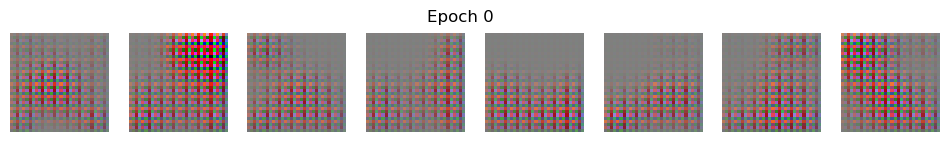

1 [D loss: 0.427570, acc.: 85.54%] [G loss: 2.360997]
2 [D loss: 0.495584, acc.: 79.35%] [G loss: 1.833962]
3 [D loss: 0.615655, acc.: 66.34%] [G loss: 1.109650]
4 [D loss: 0.590004, acc.: 69.30%] [G loss: 1.195967]
5 [D loss: 0.585874, acc.: 69.92%] [G loss: 1.200881]
6 [D loss: 0.636497, acc.: 63.60%] [G loss: 1.004885]
7 [D loss: 0.661982, acc.: 59.55%] [G loss: 0.882159]
8 [D loss: 0.663032, acc.: 59.67%] [G loss: 0.879538]
9 [D loss: 0.669345, acc.: 58.36%] [G loss: 0.857767]
10 [D loss: 0.668800, acc.: 58.86%] [G loss: 0.843816]


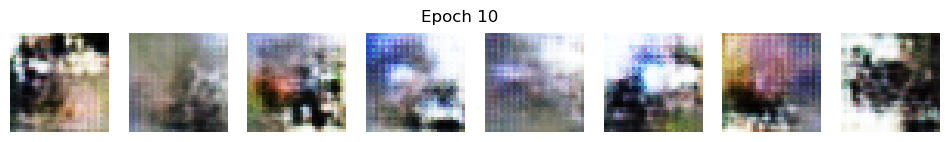

11 [D loss: 0.661836, acc.: 60.07%] [G loss: 0.860713]
12 [D loss: 0.657851, acc.: 60.11%] [G loss: 0.899365]
13 [D loss: 0.674815, acc.: 56.46%] [G loss: 0.825751]
14 [D loss: 0.675074, acc.: 56.48%] [G loss: 0.806573]
15 [D loss: 0.671911, acc.: 57.16%] [G loss: 0.820381]
16 [D loss: 0.674630, acc.: 56.68%] [G loss: 0.803275]
17 [D loss: 0.675111, acc.: 56.05%] [G loss: 0.799897]
18 [D loss: 0.671957, acc.: 57.20%] [G loss: 0.799761]
19 [D loss: 0.671831, acc.: 57.14%] [G loss: 0.799784]
20 [D loss: 0.677296, acc.: 55.71%] [G loss: 0.781641]


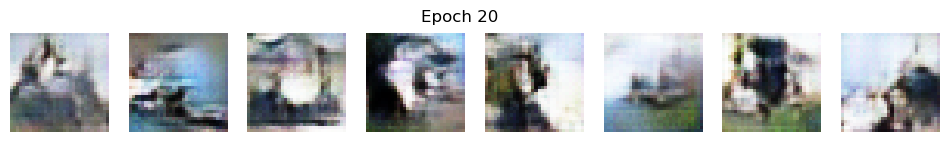

21 [D loss: 0.677067, acc.: 55.64%] [G loss: 0.780055]
22 [D loss: 0.678442, acc.: 55.26%] [G loss: 0.767868]
23 [D loss: 0.679888, acc.: 54.74%] [G loss: 0.763142]
24 [D loss: 0.680747, acc.: 54.03%] [G loss: 0.754572]
25 [D loss: 0.681706, acc.: 53.87%] [G loss: 0.746994]
26 [D loss: 0.682224, acc.: 53.96%] [G loss: 0.743337]
27 [D loss: 0.682886, acc.: 54.02%] [G loss: 0.741143]
28 [D loss: 0.681293, acc.: 54.42%] [G loss: 0.744517]
29 [D loss: 0.681846, acc.: 54.28%] [G loss: 0.750644]
30 [D loss: 0.682802, acc.: 53.89%] [G loss: 0.744140]


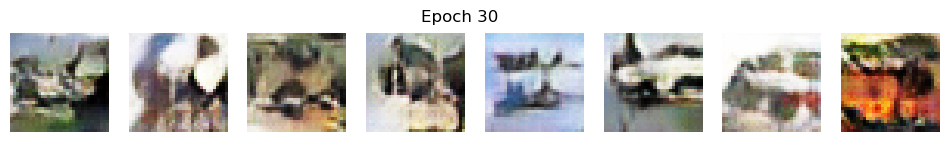

31 [D loss: 0.683411, acc.: 53.82%] [G loss: 0.740295]
32 [D loss: 0.685099, acc.: 53.03%] [G loss: 0.736914]
33 [D loss: 0.685118, acc.: 53.30%] [G loss: 0.733443]
34 [D loss: 0.685196, acc.: 53.33%] [G loss: 0.732443]
35 [D loss: 0.686078, acc.: 52.81%] [G loss: 0.730986]
36 [D loss: 0.685576, acc.: 53.14%] [G loss: 0.730016]
37 [D loss: 0.685539, acc.: 53.30%] [G loss: 0.725470]
38 [D loss: 0.685652, acc.: 53.16%] [G loss: 0.727411]
39 [D loss: 0.686023, acc.: 53.30%] [G loss: 0.727090]
40 [D loss: 0.685632, acc.: 53.46%] [G loss: 0.725468]


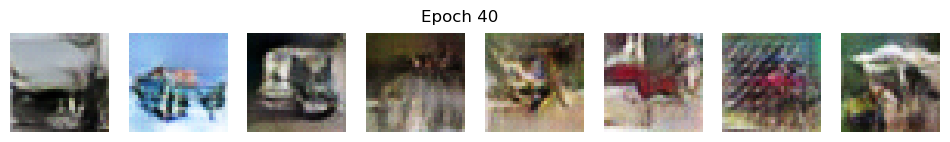

41 [D loss: 0.685929, acc.: 53.39%] [G loss: 0.728501]
42 [D loss: 0.685544, acc.: 53.71%] [G loss: 0.726890]
43 [D loss: 0.685336, acc.: 53.54%] [G loss: 0.726168]
44 [D loss: 0.685278, acc.: 53.82%] [G loss: 0.725448]
45 [D loss: 0.684963, acc.: 53.85%] [G loss: 0.726855]
46 [D loss: 0.684986, acc.: 53.96%] [G loss: 0.726819]
47 [D loss: 0.685022, acc.: 53.99%] [G loss: 0.727103]
48 [D loss: 0.684343, acc.: 54.21%] [G loss: 0.728792]
49 [D loss: 0.684087, acc.: 54.28%] [G loss: 0.730770]
50 [D loss: 0.683297, acc.: 54.57%] [G loss: 0.730502]


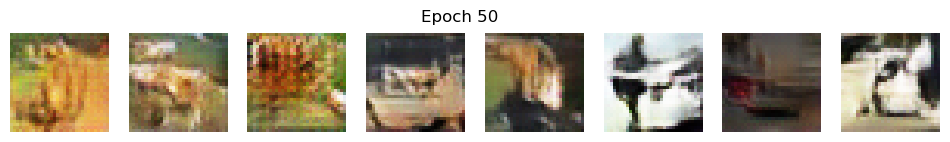

51 [D loss: 0.682372, acc.: 55.20%] [G loss: 0.731491]
52 [D loss: 0.682794, acc.: 54.91%] [G loss: 0.732619]
53 [D loss: 0.681502, acc.: 55.24%] [G loss: 0.734242]
54 [D loss: 0.681288, acc.: 55.44%] [G loss: 0.734963]
55 [D loss: 0.681374, acc.: 55.10%] [G loss: 0.733665]
56 [D loss: 0.680158, acc.: 55.72%] [G loss: 0.735897]
57 [D loss: 0.680921, acc.: 55.45%] [G loss: 0.736653]
58 [D loss: 0.679864, acc.: 55.73%] [G loss: 0.738355]
59 [D loss: 0.679800, acc.: 55.85%] [G loss: 0.739553]


In [14]:
dcgan_v2 = DCGAN_v2(32, 32, 3)
dcgan_v2.train(epochs=60, batch_size=128, save_interval=10)

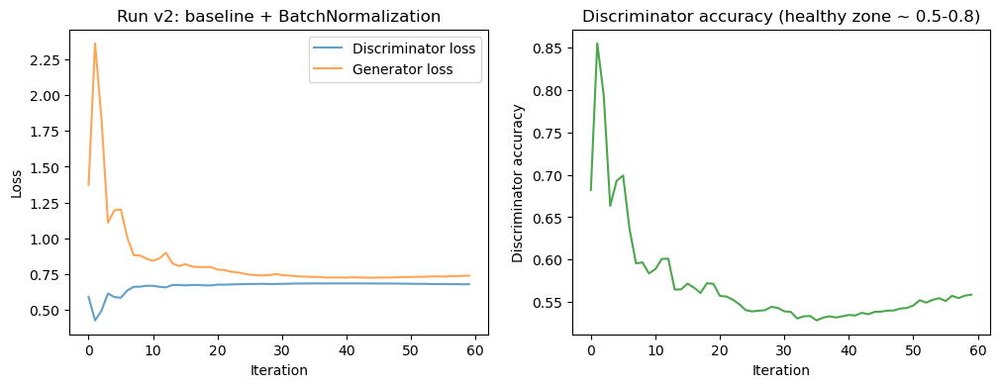

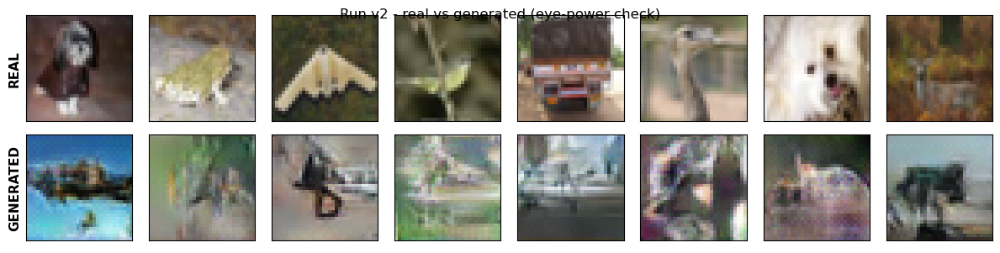

In [ ]:
# Evaluate run v2 with the SAME protocol and the SAME fixed noise seed as the baseline
dcgan_v2.plot_losses('Run v2: baseline + tuned learning rates, 60 epochs')
dcgan_v2.generator.save_weights('weights/dcgan_v2_generator.h5')

_ = real_vs_fake_grid(dcgan_v2.generator, X_test, title='Run v2 - real vs generated (eye-power check)')

### v2 training interpretation

The discriminator was initially much stronger, with accuracy above 80% during the first few epochs. However, its accuracy gradually decreased and stabilised at 55.85% by epoch 59. The discriminator loss (0.680) and generator loss (0.740) also became stable.

This suggests that the two models reached a reasonably balanced state, with the discriminator only slightly stronger than the generator. 

The generations show more variation in colour and structure, but they are still blurry and not yet clearly recognisable.



## Model v3 (failed experiment)

v3 has implemented batch normalisation on the discriminator, on top of the baseline. Same 60 epochs.

In [13]:
class DCGAN_v3():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):
        # TUNING CHANGE (v3): identical to the baseline generator -- this run isolates
        # BatchNorm on the DISCRIMINATOR only, so the generator is untouched
        model = Sequential(name='Generator')

        model.add(Dense(128 * 8 * 8, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((8, 8, 128)))
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(ReLU())
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        # TUNING CHANGE (v3): BatchNormalization added after each Conv2D, before the
        # activation -- the ONLY difference from the baseline discriminator
        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(BatchNormalization())  # TUNING CHANGE (v3)
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(BatchNormalization())  # TUNING CHANGE (v3)
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()

                # CHANGED (fix): v3 is the ONLY model with BatchNormalization in the
                # discriminator. With separate all-real / all-fake train_on_batch calls,
                # BatchNorm's per-batch statistics let the discriminator trivially tell
                # real and fake apart (100% acc, 0 loss, dead G gradient) without learning
                # any real visual features -- so ONLY v3 needs the combined-batch fix below.
                # baseline/v2/v4/v5 have no BatchNorm in their discriminator, so their conv/
                # ReLU/Dropout layers process each image independently either way -- the
                # two-call pattern is not a bug for them, just a (harmless) older style.
                combined_imgs = np.concatenate([imgs, gen_imgs], axis=0)
                combined_labels = np.concatenate([valid, fake], axis=0)
                d_loss = self.discriminator.train_on_batch(combined_imgs, combined_labels)

                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            if epoch % save_interval == 0 or epoch == epochs - 1:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("generated_cifar10_v3/dcgan_cifar10_{:d}.png".format(epoch))
        plt.close()

    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    def plot_losses(self, title='DCGAN v3 training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Epoch'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Epoch'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 16, 16, 128)       3584      
                                                                 
 batch_normalization_2 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 re_lu_27 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 dropout_12 (Dropout)        (None, 16, 16, 128)       0         
                                                                 
 conv2d_19 (Conv2D)          (None, 8, 8, 128)         147584    
                                                                 
 batch_normalization_3 (Batc  (None, 8, 8, 128)        512       
 hNormalization)                                     

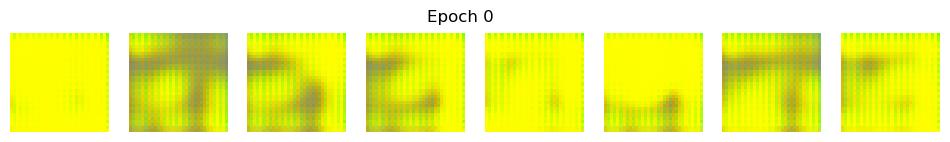

1 [D loss: 0.089362, acc.: 97.34%] [G loss: 3.405349]
2 [D loss: 0.125502, acc.: 96.05%] [G loss: 3.529680]
3 [D loss: 0.065253, acc.: 98.06%] [G loss: 1.934901]
4 [D loss: 0.011085, acc.: 99.74%] [G loss: 0.399439]
5 [D loss: 0.013589, acc.: 99.61%] [G loss: 0.763538]
6 [D loss: 0.014824, acc.: 99.58%] [G loss: 2.508672]
7 [D loss: 0.002463, acc.: 99.95%] [G loss: 0.749671]
8 [D loss: 0.002702, acc.: 99.93%] [G loss: 5.116375]
9 [D loss: 0.009066, acc.: 99.78%] [G loss: 2.885848]
10 [D loss: 0.023552, acc.: 99.58%] [G loss: 3.960395]


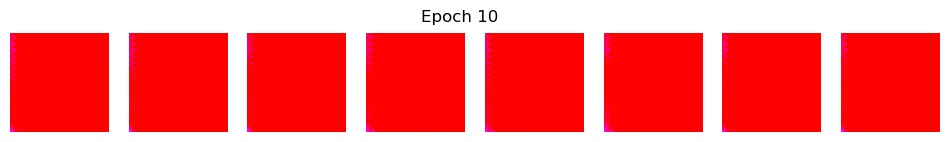

11 [D loss: 0.013964, acc.: 99.58%] [G loss: 6.084345]
12 [D loss: 0.020282, acc.: 99.48%] [G loss: 7.050966]
13 [D loss: 0.001742, acc.: 99.96%] [G loss: 4.956005]
14 [D loss: 0.004353, acc.: 99.84%] [G loss: 10.463654]
15 [D loss: 0.000549, acc.: 99.99%] [G loss: 5.059899]
16 [D loss: 0.004302, acc.: 99.86%] [G loss: 12.276622]
17 [D loss: 0.013305, acc.: 99.67%] [G loss: 3.229868]
18 [D loss: 0.003635, acc.: 99.93%] [G loss: 0.077008]
19 [D loss: 0.001399, acc.: 99.97%] [G loss: 0.317559]
20 [D loss: 0.000405, acc.: 99.99%] [G loss: 7.430541]


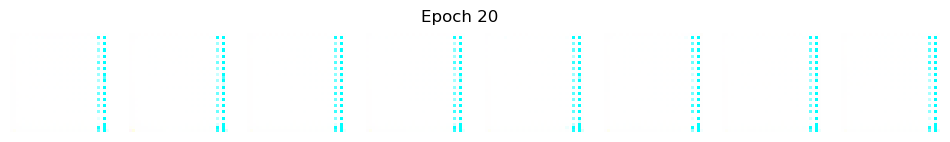

21 [D loss: 0.001784, acc.: 99.96%] [G loss: 12.448643]
22 [D loss: 0.000200, acc.: 100.00%] [G loss: 10.427540]
23 [D loss: 0.000104, acc.: 100.00%] [G loss: 11.450229]
24 [D loss: 0.009383, acc.: 99.85%] [G loss: 11.100779]
25 [D loss: 0.004234, acc.: 99.94%] [G loss: 18.867202]
26 [D loss: 0.000198, acc.: 100.00%] [G loss: 13.022404]
27 [D loss: 0.009271, acc.: 99.78%] [G loss: 15.435758]
28 [D loss: 0.000100, acc.: 100.00%] [G loss: 10.891979]
29 [D loss: 0.000065, acc.: 100.00%] [G loss: 10.818638]
30 [D loss: 0.000050, acc.: 100.00%] [G loss: 11.085007]


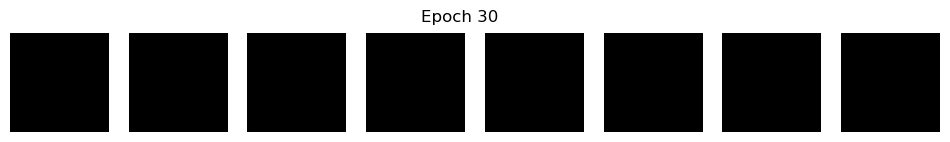

31 [D loss: 0.000040, acc.: 100.00%] [G loss: 11.286551]
32 [D loss: 0.000041, acc.: 100.00%] [G loss: 11.171314]
33 [D loss: 0.000011, acc.: 100.00%] [G loss: 11.756289]
34 [D loss: 0.000013, acc.: 100.00%] [G loss: 11.977778]
35 [D loss: 0.000017, acc.: 100.00%] [G loss: 11.855521]
36 [D loss: 0.002371, acc.: 99.94%] [G loss: 26.623727]
37 [D loss: 0.042679, acc.: 99.54%] [G loss: 24.731340]
38 [D loss: 0.000005, acc.: 100.00%] [G loss: 13.508686]
39 [D loss: 0.000004, acc.: 100.00%] [G loss: 13.233147]
40 [D loss: 0.000003, acc.: 100.00%] [G loss: 13.236207]


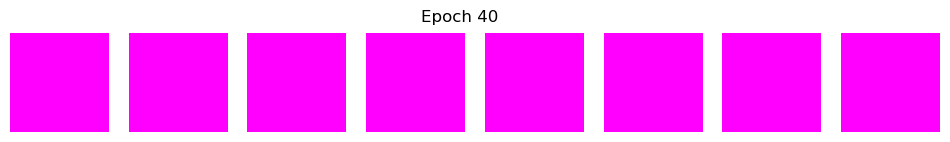

41 [D loss: 0.000002, acc.: 100.00%] [G loss: 13.267309]
42 [D loss: 0.000002, acc.: 100.00%] [G loss: 13.307720]
43 [D loss: 0.000002, acc.: 100.00%] [G loss: 13.367782]
44 [D loss: 0.000002, acc.: 100.00%] [G loss: 13.441225]
45 [D loss: 0.000001, acc.: 100.00%] [G loss: 13.515745]
46 [D loss: 0.000001, acc.: 100.00%] [G loss: 13.614839]
47 [D loss: 0.000001, acc.: 100.00%] [G loss: 13.713045]
48 [D loss: 0.000001, acc.: 100.00%] [G loss: 13.826611]
49 [D loss: 0.000001, acc.: 100.00%] [G loss: 13.959584]
50 [D loss: 0.000001, acc.: 100.00%] [G loss: 14.089947]


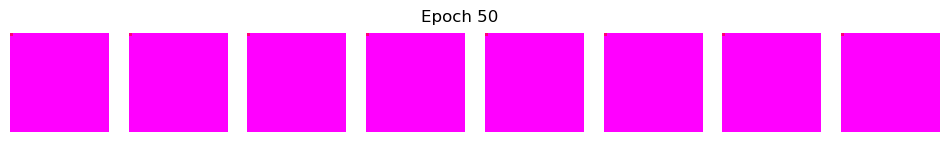

51 [D loss: 0.000001, acc.: 100.00%] [G loss: 14.222377]
52 [D loss: 0.000000, acc.: 100.00%] [G loss: 14.372268]
53 [D loss: 0.000000, acc.: 100.00%] [G loss: 14.527304]
54 [D loss: 0.000014, acc.: 100.00%] [G loss: 6.723638]
55 [D loss: 0.000133, acc.: 100.00%] [G loss: 9.845557]
56 [D loss: 0.000427, acc.: 99.99%] [G loss: 13.272615]
57 [D loss: 0.000276, acc.: 100.00%] [G loss: 15.193064]
58 [D loss: 0.020180, acc.: 99.81%] [G loss: 15.256605]
59 [D loss: 0.002303, acc.: 99.98%] [G loss: 0.556946]


In [37]:
dcgan_v3 = DCGAN_v3(32, 32, 3)
dcgan_v3.train(epochs=60, batch_size=128, save_interval=10)

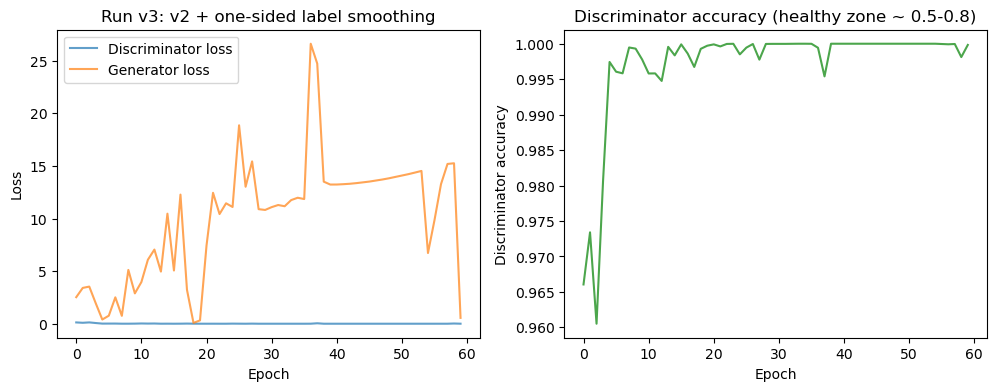

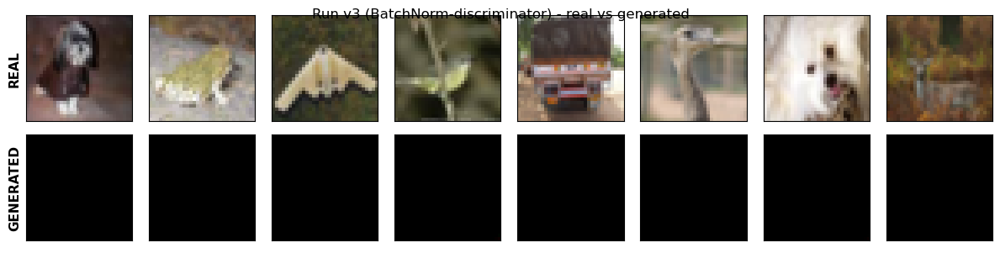

In [ ]:


# Evaluate run v3 - same protocol, same seed
dcgan_v3.plot_losses('Run v3: v1 + BatchNorm-discriminator')
dcgan_v3.generator.save_weights('weights/dcgan_v3_generator.h5')

_ = real_vs_fake_grid(dcgan_v3.generator, X_test, title='Run v3 (BatchNorm-discriminator) - real vs generated')

### v3 training interpretation

v3 was unsuccessful. The discriminator quickly became too strong.

It reached 99.98% accuracy with a very low loss of 0.002 at epoch 59. This means it could almost perfectly distinguish real images from generated images.

Once the discriminator reached almost 100% accuracy, it gave the generator poor learning signals. The generator then started outputting near black images instead of learning realistic CIFAR-10 patterns indicating to mode collapse.


## Model v4 (failed experiment)

v4 has implemented batch normalisation on the generator, on top of the baseline. Same 60 epochs.

In [14]:
class DCGAN_v4():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):
        # TUNING CHANGE (v4): BatchNormalization added after each Conv2DTranspose, before
        # the activation -- the ONLY difference from the baseline generator
        model = Sequential(name='Generator')

        model.add(Dense(128 * 8 * 8, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((8, 8, 128)))
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(BatchNormalization())  # TUNING CHANGE (v4)
        model.add(ReLU())
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(BatchNormalization())  # TUNING CHANGE (v4)
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        # TUNING CHANGE (v4): identical to the baseline discriminator -- this run isolates
        # BatchNorm on the GENERATOR only, so the discriminator is untouched
        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()

                d_loss_real = self.discriminator.train_on_batch(imgs, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            if epoch % save_interval == 0 or epoch == epochs - 1:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("generated_cifar10_v4/dcgan_cifar10_{:d}.png".format(epoch))
        plt.close()

    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    def plot_losses(self, title='DCGAN v4 training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Epoch'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Epoch'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 16, 16, 128)       3584      
                                                                 
 re_lu_12 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 dropout_6 (Dropout)         (None, 16, 16, 128)       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 8, 8, 128)         147584    
                                                                 
 re_lu_13 (ReLU)             (None, 8, 8, 128)         0         
                                                                 
 dropout_7 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_3 (Flatten)         (None, 8192)            

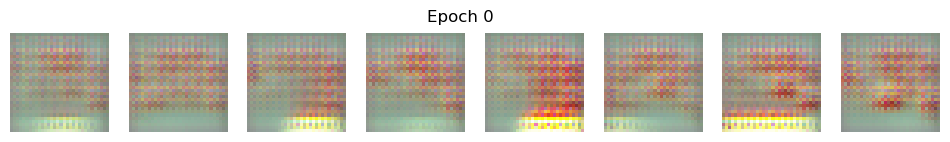

1 [D loss: 0.592911, acc.: 66.70%] [G loss: 0.530635]
2 [D loss: 0.571589, acc.: 70.97%] [G loss: 0.678906]
3 [D loss: 0.356328, acc.: 85.94%] [G loss: 0.143233]
4 [D loss: 0.329839, acc.: 85.74%] [G loss: 0.257072]
5 [D loss: 0.441654, acc.: 80.52%] [G loss: 0.380984]
6 [D loss: 0.470191, acc.: 76.55%] [G loss: 0.448903]
7 [D loss: 0.368816, acc.: 81.01%] [G loss: 0.425312]
8 [D loss: 0.532045, acc.: 75.51%] [G loss: 0.489537]
9 [D loss: 0.524380, acc.: 77.53%] [G loss: 0.655642]
10 [D loss: 0.333491, acc.: 87.20%] [G loss: 0.454844]


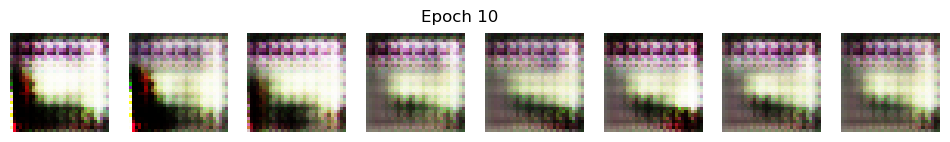

11 [D loss: 0.616185, acc.: 69.32%] [G loss: 0.904078]
12 [D loss: 0.529336, acc.: 74.86%] [G loss: 0.492434]
13 [D loss: 0.440129, acc.: 80.57%] [G loss: 0.863399]
14 [D loss: 0.514356, acc.: 73.52%] [G loss: 1.016248]
15 [D loss: 0.611184, acc.: 66.45%] [G loss: 0.847103]
16 [D loss: 0.457070, acc.: 76.81%] [G loss: 1.050098]
17 [D loss: 0.275716, acc.: 90.15%] [G loss: 0.516034]
18 [D loss: 0.557236, acc.: 71.66%] [G loss: 0.903446]
19 [D loss: 0.371808, acc.: 83.89%] [G loss: 0.658408]
20 [D loss: 0.475550, acc.: 75.78%] [G loss: 0.656774]


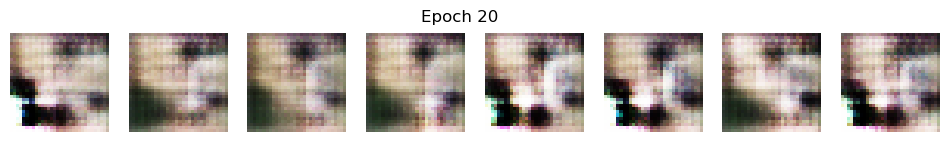

21 [D loss: 0.424214, acc.: 79.97%] [G loss: 0.983338]
22 [D loss: 0.398759, acc.: 82.13%] [G loss: 1.088890]
23 [D loss: 0.314021, acc.: 87.15%] [G loss: 0.860306]
24 [D loss: 0.397708, acc.: 84.27%] [G loss: 1.388222]
25 [D loss: 0.325548, acc.: 87.49%] [G loss: 0.675175]
26 [D loss: 0.350523, acc.: 86.27%] [G loss: 0.999090]
27 [D loss: 0.388278, acc.: 84.21%] [G loss: 1.658015]
28 [D loss: 0.420660, acc.: 80.92%] [G loss: 1.155663]
29 [D loss: 0.573889, acc.: 70.51%] [G loss: 1.015906]
30 [D loss: 0.447592, acc.: 78.94%] [G loss: 1.130488]


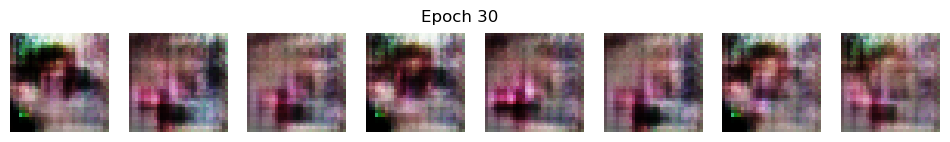

31 [D loss: 0.387706, acc.: 82.94%] [G loss: 0.953400]
32 [D loss: 0.453005, acc.: 79.96%] [G loss: 1.180869]
33 [D loss: 0.343705, acc.: 85.27%] [G loss: 1.049902]
34 [D loss: 0.238026, acc.: 90.62%] [G loss: 1.008475]
35 [D loss: 0.218069, acc.: 92.20%] [G loss: 0.759946]
36 [D loss: 0.333671, acc.: 87.42%] [G loss: 1.189539]
37 [D loss: 0.279619, acc.: 89.82%] [G loss: 1.263678]
38 [D loss: 0.331047, acc.: 87.38%] [G loss: 1.500567]
39 [D loss: 0.277256, acc.: 89.97%] [G loss: 1.148429]
40 [D loss: 0.217537, acc.: 92.41%] [G loss: 0.973103]


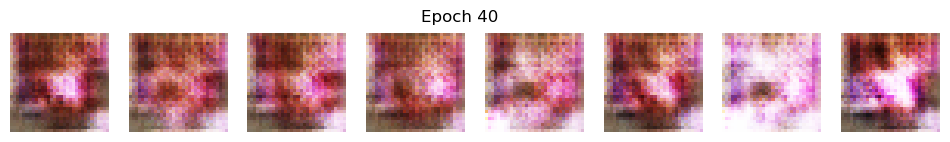

41 [D loss: 0.188646, acc.: 93.30%] [G loss: 1.210129]
42 [D loss: 0.281095, acc.: 88.70%] [G loss: 1.288689]
43 [D loss: 0.342253, acc.: 85.17%] [G loss: 1.424188]
44 [D loss: 0.423529, acc.: 81.66%] [G loss: 1.436951]
45 [D loss: 0.430793, acc.: 82.52%] [G loss: 1.274093]
46 [D loss: 0.334895, acc.: 87.89%] [G loss: 1.057913]
47 [D loss: 0.264027, acc.: 89.61%] [G loss: 1.834973]
48 [D loss: 0.451472, acc.: 80.04%] [G loss: 1.434525]
49 [D loss: 0.233206, acc.: 90.48%] [G loss: 1.034457]
50 [D loss: 0.342898, acc.: 87.13%] [G loss: 1.621550]


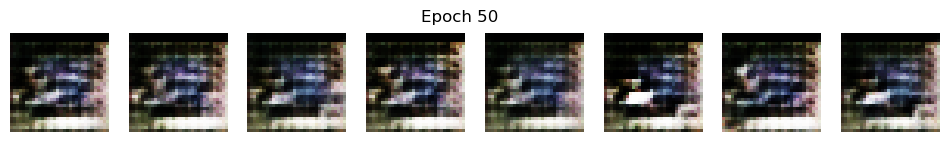

51 [D loss: 0.347996, acc.: 86.51%] [G loss: 1.393079]
52 [D loss: 0.269233, acc.: 89.94%] [G loss: 1.699386]
53 [D loss: 0.285993, acc.: 88.53%] [G loss: 1.653206]
54 [D loss: 0.380735, acc.: 84.65%] [G loss: 1.335788]
55 [D loss: 0.494450, acc.: 77.20%] [G loss: 1.727760]
56 [D loss: 0.475841, acc.: 78.32%] [G loss: 1.002895]
57 [D loss: 0.425953, acc.: 82.41%] [G loss: 1.773244]
58 [D loss: 0.412449, acc.: 81.48%] [G loss: 1.802171]
59 [D loss: 0.348379, acc.: 86.59%] [G loss: 0.779658]


In [20]:
dcgan_v4 = DCGAN_v4(32, 32, 3)
dcgan_v4.train(epochs=60, batch_size=128, save_interval=10)

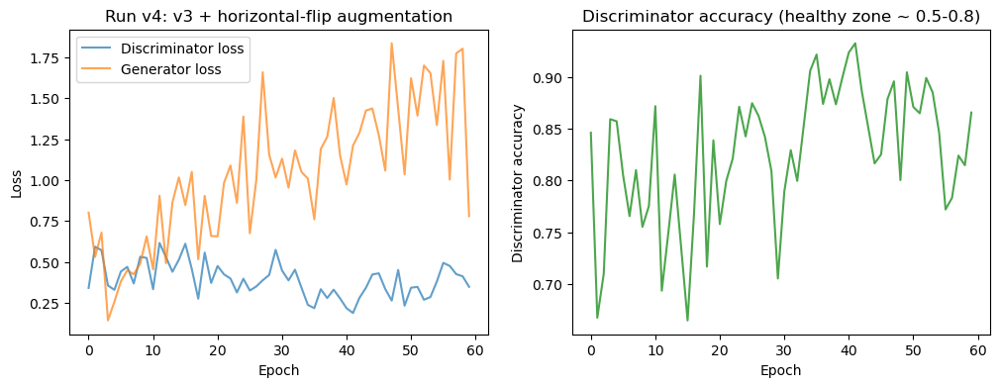

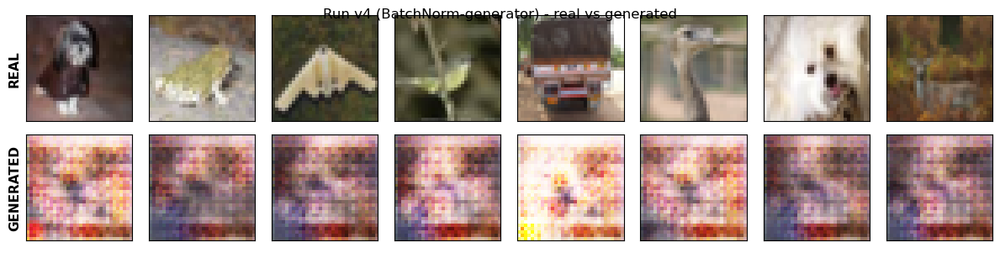

In [ ]:
# Evaluate run v4 - same protocol, same seed
dcgan_v4.plot_losses('Run v4: v1 + BatchNorm-generator')
dcgan_v4.generator.save_weights('weights/dcgan_v4_generator.h5')

_ = real_vs_fake_grid(dcgan_v4.generator, X_test, title='Run v4 (BatchNorm-generator) - real vs generated')

### v4 training interpretation

v4 was also unsuccessful. 

By epoch 59, the discriminator reached 86.59% accuracy with a low loss of 0.348, showing that it had become much stronger than the generator.

BatchNorm was added to the generator, but it changed the generator’s feature distributions and produced blurrier, repetitive checkerboard-like images. Those fakes became easier for the unchanged discriminator to spot.


## Model v5

v5 keeps the same generator as the baseline, but makes the discriminator deeper and wider.this tests whether a more powerful discriminator helps the generator learn better features or if it becomes too strong and harms GAN balance.

The new discriminators first convolution layer detects simple patterns such as colours and edges. The second and third convolution layers learn more complex shapes and textures, while reducing the image from 32×32 to 16×16, then 8×8, and finally 4×4.

The number of filters increases from 128 to 256 and then 512, allowing the discriminator to learn more features at deeper layers. Dropout (0.2) is used after every convolution block to reduce overfitting. 


In [15]:
class DCGAN_v5():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):
        # TUNING CHANGE (v5): identical to the baseline generator -- this run isolates the
        # discriminator's layer/filter-count change only
        model = Sequential(name='Generator')

        model.add(Dense(128 * 8 * 8, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((8, 8, 128)))
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(ReLU())
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        # TUNING CHANGE (v5): added a third Conv2D block and widened filters 128 -> 256 -> 512
        # (was 2 conv layers at 128 filters each in baseline) -- deeper + wider discriminator,
        # everything else (ReLU, Dropout(0.2) pattern, no BatchNorm) kept identical to baseline
        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))  # 32x32 -> 16x16
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Conv2D(256, kernel_size=3, strides=2, padding="same"))  # TUNING CHANGE (v5): 16x16 -> 8x8, 128 -> 256 filters
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Conv2D(512, kernel_size=3, strides=2, padding="same"))  # TUNING CHANGE (v5): new layer, 8x8 -> 4x4, 512 filters
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()

                d_loss_real = self.discriminator.train_on_batch(imgs, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            if epoch % save_interval == 0 or epoch == epochs - 1:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("generated_cifar10_v5/dcgan_cifar10_{:d}.png".format(epoch))
        plt.close()

    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    def plot_losses(self, title='DCGAN v5 training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Epoch'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Epoch'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 16, 16, 128)       3584      
                                                                 
 re_lu_31 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 dropout_14 (Dropout)        (None, 16, 16, 128)       0         
                                                                 
 conv2d_22 (Conv2D)          (None, 8, 8, 256)         295168    
                                                                 
 re_lu_32 (ReLU)             (None, 8, 8, 256)         0         
                                                                 
 dropout_15 (Dropout)        (None, 8, 8, 256)         0         
                                                                 
 conv2d_23 (Conv2D)          (None, 4, 4, 512)       

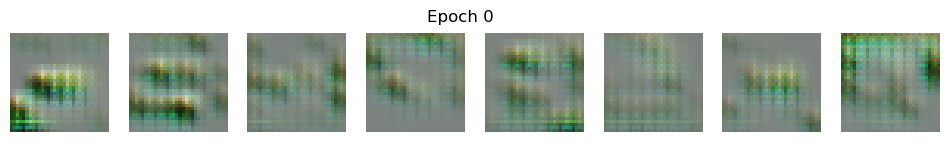

1 [D loss: 0.619339, acc.: 64.98%] [G loss: 1.078854]
2 [D loss: 0.619114, acc.: 66.06%] [G loss: 1.031090]
3 [D loss: 0.663811, acc.: 60.67%] [G loss: 0.859895]
4 [D loss: 0.671905, acc.: 58.21%] [G loss: 0.810140]
5 [D loss: 0.669062, acc.: 58.47%] [G loss: 0.831638]
6 [D loss: 0.662913, acc.: 60.46%] [G loss: 0.844921]
7 [D loss: 0.646270, acc.: 63.12%] [G loss: 0.935092]
8 [D loss: 0.645769, acc.: 62.68%] [G loss: 0.911787]
9 [D loss: 0.654202, acc.: 60.94%] [G loss: 0.904689]
10 [D loss: 0.657201, acc.: 60.94%] [G loss: 0.856950]


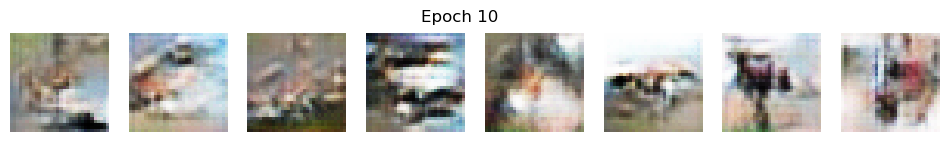

11 [D loss: 0.660433, acc.: 60.35%] [G loss: 0.841334]
12 [D loss: 0.657869, acc.: 61.02%] [G loss: 0.842590]
13 [D loss: 0.659883, acc.: 60.73%] [G loss: 0.836374]
14 [D loss: 0.663208, acc.: 59.79%] [G loss: 0.815650]
15 [D loss: 0.666499, acc.: 59.38%] [G loss: 0.798162]
16 [D loss: 0.667126, acc.: 59.19%] [G loss: 0.794179]
17 [D loss: 0.667884, acc.: 59.21%] [G loss: 0.792754]
18 [D loss: 0.669836, acc.: 58.62%] [G loss: 0.784325]
19 [D loss: 0.669017, acc.: 58.79%] [G loss: 0.781266]
20 [D loss: 0.669369, acc.: 58.78%] [G loss: 0.779100]


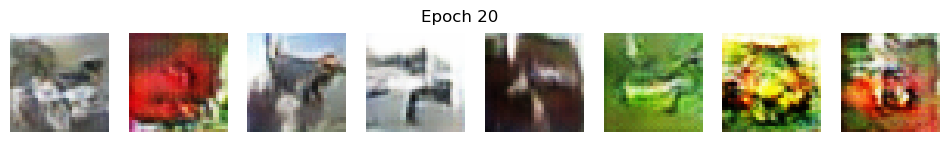

21 [D loss: 0.670573, acc.: 58.57%] [G loss: 0.779731]
22 [D loss: 0.671541, acc.: 58.20%] [G loss: 0.773024]
23 [D loss: 0.671074, acc.: 58.40%] [G loss: 0.772774]
24 [D loss: 0.669477, acc.: 58.85%] [G loss: 0.777236]
25 [D loss: 0.668080, acc.: 59.17%] [G loss: 0.779699]
26 [D loss: 0.667536, acc.: 59.26%] [G loss: 0.783140]
27 [D loss: 0.666746, acc.: 59.56%] [G loss: 0.783440]
28 [D loss: 0.665828, acc.: 59.57%] [G loss: 0.785688]
29 [D loss: 0.664273, acc.: 59.71%] [G loss: 0.789986]
30 [D loss: 0.662493, acc.: 60.03%] [G loss: 0.793281]


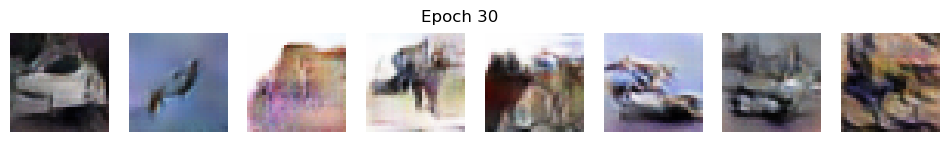

31 [D loss: 0.660740, acc.: 60.62%] [G loss: 0.800614]
32 [D loss: 0.658554, acc.: 60.76%] [G loss: 0.803946]
33 [D loss: 0.656777, acc.: 60.97%] [G loss: 0.810161]
34 [D loss: 0.655043, acc.: 61.33%] [G loss: 0.815022]
35 [D loss: 0.652372, acc.: 61.71%] [G loss: 0.820173]
36 [D loss: 0.649706, acc.: 62.11%] [G loss: 0.830656]
37 [D loss: 0.647605, acc.: 62.35%] [G loss: 0.834406]
38 [D loss: 0.644345, acc.: 62.80%] [G loss: 0.844258]
39 [D loss: 0.640589, acc.: 63.51%] [G loss: 0.853742]
40 [D loss: 0.638001, acc.: 63.78%] [G loss: 0.858973]


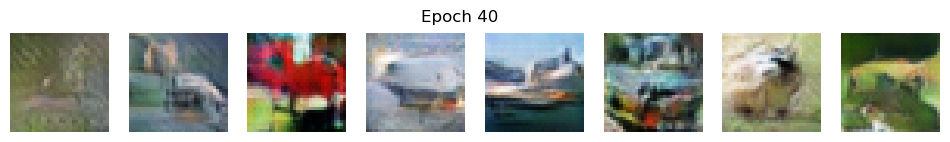

41 [D loss: 0.633454, acc.: 64.51%] [G loss: 0.870290]
42 [D loss: 0.630678, acc.: 64.75%] [G loss: 0.881478]
43 [D loss: 0.627641, acc.: 64.94%] [G loss: 0.888817]
44 [D loss: 0.624682, acc.: 65.33%] [G loss: 0.899880]
45 [D loss: 0.621501, acc.: 65.64%] [G loss: 0.907340]
46 [D loss: 0.617630, acc.: 66.24%] [G loss: 0.918785]
47 [D loss: 0.614247, acc.: 66.28%] [G loss: 0.930628]
48 [D loss: 0.610381, acc.: 66.90%] [G loss: 0.939299]
49 [D loss: 0.607293, acc.: 67.07%] [G loss: 0.949569]
50 [D loss: 0.603631, acc.: 67.58%] [G loss: 0.960751]


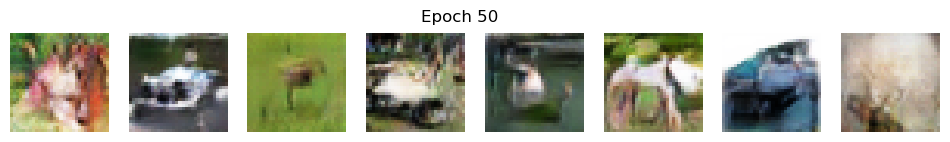

51 [D loss: 0.598867, acc.: 67.87%] [G loss: 0.973105]
52 [D loss: 0.593717, acc.: 68.26%] [G loss: 0.986995]
53 [D loss: 0.591385, acc.: 68.81%] [G loss: 0.994175]
54 [D loss: 0.587818, acc.: 68.91%] [G loss: 1.012032]
55 [D loss: 0.581278, acc.: 69.63%] [G loss: 1.021257]
56 [D loss: 0.578204, acc.: 69.74%] [G loss: 1.035062]
57 [D loss: 0.575131, acc.: 70.07%] [G loss: 1.047046]
58 [D loss: 0.571187, acc.: 70.57%] [G loss: 1.062571]
59 [D loss: 0.567267, acc.: 70.67%] [G loss: 1.071731]


In [41]:
dcgan_v5 = DCGAN_v5(32, 32, 3)
dcgan_v5.train(epochs=60, batch_size=128, save_interval=10)

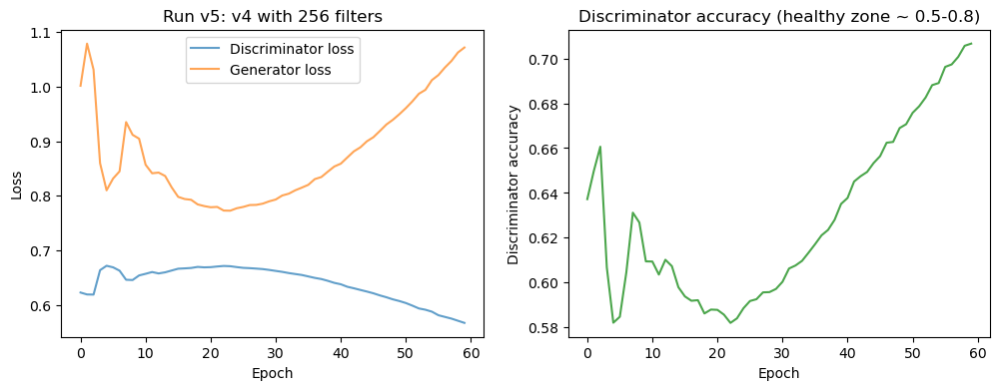

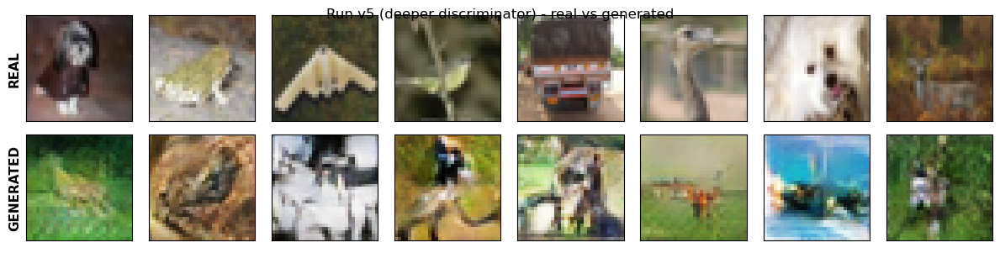

In [42]:
# Evaluate run v5 - same protocol, same seed
dcgan_v5.plot_losses('Run v5: v4 with 256 filters')
dcgan_v5.generator.save_weights('weights/dcgan_v5_generator.h5')

_ = real_vs_fake_grid(dcgan_v5.generator, X_test, title='Run v5 (deeper discriminator) - real vs generated')

### v5 training interpretation

v5 produced more diverse and colourful generated images than the earlier failed BatchNorm experiments. Some generated images show rough object-like shapes, although they are still blurry and not clearly recognisable.

 After around epoch 25, discriminator accuracy increased steadily. By epoch 59, it reached 70.67%, while discriminator loss fell to 0.567 and generator loss increased to 1.072. This shows that the deeper discriminator was gradually becoming stronger than the generator.

the growing discriminator advantage suggests that the model may become unstable if trained much longer.

## Model v6 (failed)

v6 keeps the same discriminator as the baseline, but makes the generator deeper and wider.
v6 starts with a smaller image area but more feature channels. This lets the generator first learn many high-level features in a compact 4×4 representation, then build the image more gradually-

Baseline: 8 × 8 × 128 = 8,192
v6: 4 × 4 × 512 = 8,192

The v6 generator takes a 100-dimensional random noise vector and expands it into a compact 4×4 feature map with 512 channels. It then uses three transposed convolution layers to gradually enlarge the feature map from 4×4 to 8×8, then 16×16, and finally 32×32.
The number of filters decreases from 512 to 256 and then 128 as the image becomes larger. This allows the generator to first learn many high-level features in a small representation, then progressively turn them into image structure, colours, and finer details.

In [16]:
class DCGAN_v6():

    def __init__(self, rows, cols, channels, z = 100):
        # Input shape
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):
        # TUNING CHANGE (v6): added a third Conv2DTranspose stage (starts at 4x4 instead of
        # 8x8) and widened filters 512 -> 256 -> 128 (baseline: 2 stages, 128 filters each,
        # starting from 8x8) -- deeper + wider generator, mirrors v5's discriminator change
        model = Sequential(name='Generator')

        model.add(Dense(512 * 4 * 4, activation="relu", input_dim=self.latent_dim))  # TUNING CHANGE (v6): 4x4 start, 512 filters
        model.add(Reshape((4, 4, 512)))  # TUNING CHANGE (v6)
        model.add(Conv2DTranspose(512, (4,4), strides=(2,2), padding='same'))  # TUNING CHANGE (v6): 4x4 -> 8x8
        model.add(ReLU())
        model.add(Conv2DTranspose(256, (4,4), strides=(2,2), padding='same'))  # TUNING CHANGE (v6): 8x8 -> 16x16, new layer
        model.add(ReLU())
        model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))  # 16x16 -> 32x32
        model.add(ReLU())
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):
        # TUNING CHANGE (v6): identical to the baseline discriminator -- this run isolates
        # the generator's depth/width change only
        model = Sequential(name='Discriminator')

        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(ReLU())
        model.add(Dropout(0.2))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))

        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, save_interval=10):

        X_train = X_train_scaled  # CHANGED: reuse the CIFAR-10 array already loaded once at the top instead of re-downloading/re-loading every run

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        steps_per_epoch = X_train.shape[0] // batch_size

        for epoch in range(epochs):

            perm = np.random.permutation(X_train.shape[0])
            epoch_d_losses, epoch_g_losses, epoch_d_accs = [], [], []

            for step in range(steps_per_epoch):

                idx = perm[step * batch_size:(step + 1) * batch_size]
                imgs = X_train[idx]

                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator(noise, training=False).numpy()

                d_loss_real = self.discriminator.train_on_batch(imgs, valid)
                d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                g_loss = self.combined.train_on_batch(noise, valid)

                epoch_d_losses.append(d_loss[0])
                epoch_g_losses.append(g_loss)
                epoch_d_accs.append(d_loss[1])

            mean_d_loss = float(np.mean(epoch_d_losses))
            mean_g_loss = float(np.mean(epoch_g_losses))
            mean_d_acc = float(np.mean(epoch_d_accs))
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, mean_d_loss, 100*mean_d_acc, mean_g_loss))
            self.d_loss_history.append(mean_d_loss)
            self.g_loss_history.append(mean_g_loss)
            self.d_acc_history.append(mean_d_acc)

            if epoch % 10 == 0:
                self.show_row_imgs(epoch)

            if epoch % save_interval == 0 or epoch == epochs - 1:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("generated_cifar10_v6/dcgan_cifar10_{:d}.png".format(epoch))
        plt.close()

    def show_row_imgs(self, epoch, n=8):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator(noise, training=False).numpy()

        fig, axs = plt.subplots(1, n, figsize=(n * 1.5, 1.5))
        for i in range(n):
            axs[i].imshow(gen_imgs[i])
            axs[i].axis('off')
        fig.suptitle(f'Epoch {epoch}')
        plt.show()

    def plot_losses(self, title='DCGAN v6 training losses'):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator loss', alpha=0.7)
        axs[0].plot(self.g_loss_history, label='Generator loss', alpha=0.7)
        axs[0].set_xlabel('Epoch'); axs[0].set_ylabel('Loss'); axs[0].legend()
        axs[0].set_title(title)
        axs[1].plot(self.d_acc_history, color='green', alpha=0.7)
        axs[1].set_xlabel('Epoch'); axs[1].set_ylabel('Discriminator accuracy')
        axs[1].set_title('Discriminator accuracy (healthy zone ~ 0.5-0.8)')
        plt.show()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 16, 16, 128)       3584      
                                                                 
 re_lu_36 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 dropout_17 (Dropout)        (None, 16, 16, 128)       0         
                                                                 
 conv2d_26 (Conv2D)          (None, 8, 8, 128)         147584    
                                                                 
 re_lu_37 (ReLU)             (None, 8, 8, 128)         0         
                                                                 
 dropout_18 (Dropout)        (None, 8, 8, 128)         0         
                                                                 
 flatten_8 (Flatten)         (None, 8192)            

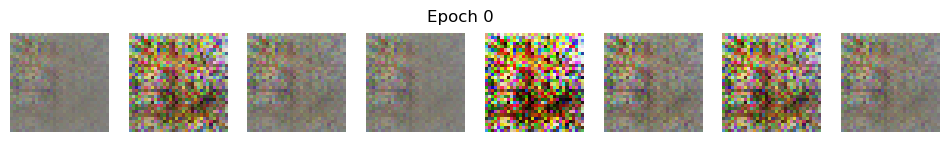

1 [D loss: 0.702916, acc.: 33.75%] [G loss: 0.690969]
2 [D loss: 0.693091, acc.: 44.62%] [G loss: 0.690611]
3 [D loss: 0.684175, acc.: 51.81%] [G loss: 0.727824]
4 [D loss: 0.696009, acc.: 48.72%] [G loss: 0.782857]
5 [D loss: 0.699947, acc.: 46.46%] [G loss: 0.763685]
6 [D loss: 0.697045, acc.: 46.61%] [G loss: 0.769239]
7 [D loss: 0.690907, acc.: 51.18%] [G loss: 0.775127]
8 [D loss: 0.686768, acc.: 51.16%] [G loss: 0.801161]
9 [D loss: 0.696780, acc.: 47.51%] [G loss: 0.770555]
10 [D loss: 0.696136, acc.: 47.59%] [G loss: 0.767924]


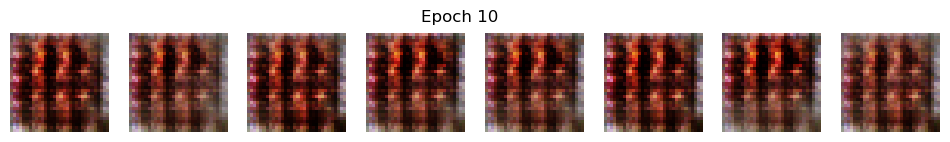

11 [D loss: 0.686240, acc.: 51.94%] [G loss: 0.806895]
12 [D loss: 0.694369, acc.: 47.81%] [G loss: 0.797104]
13 [D loss: 0.679219, acc.: 54.58%] [G loss: 0.807735]
14 [D loss: 0.690032, acc.: 49.63%] [G loss: 0.794811]
15 [D loss: 0.678657, acc.: 52.60%] [G loss: 0.803580]
16 [D loss: 0.683177, acc.: 51.49%] [G loss: 0.805211]
17 [D loss: 0.690286, acc.: 49.58%] [G loss: 0.764112]
18 [D loss: 0.692118, acc.: 49.20%] [G loss: 0.766405]
19 [D loss: 0.688639, acc.: 48.73%] [G loss: 0.774816]
20 [D loss: 0.673141, acc.: 56.93%] [G loss: 0.847343]


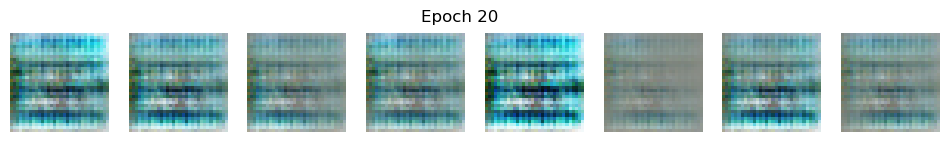

21 [D loss: 0.691789, acc.: 47.91%] [G loss: 0.794924]
22 [D loss: 0.686550, acc.: 51.39%] [G loss: 0.786544]
23 [D loss: 0.687672, acc.: 50.45%] [G loss: 0.837161]
24 [D loss: 0.685165, acc.: 52.21%] [G loss: 0.815627]
25 [D loss: 0.683734, acc.: 52.42%] [G loss: 0.831650]
26 [D loss: 0.665767, acc.: 55.44%] [G loss: 0.894477]
27 [D loss: 0.683575, acc.: 49.66%] [G loss: 0.809937]
28 [D loss: 0.694271, acc.: 48.27%] [G loss: 0.753846]
29 [D loss: 0.700262, acc.: 43.12%] [G loss: 0.716115]
30 [D loss: 0.695172, acc.: 46.04%] [G loss: 0.712425]


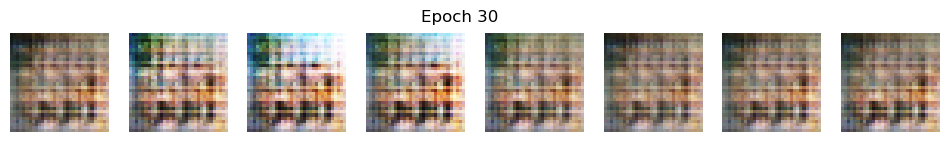

31 [D loss: 0.693476, acc.: 48.82%] [G loss: 0.731940]
32 [D loss: 0.698603, acc.: 47.58%] [G loss: 0.742704]
33 [D loss: 0.695680, acc.: 45.16%] [G loss: 0.715808]
34 [D loss: 0.693207, acc.: 48.26%] [G loss: 0.705224]
35 [D loss: 0.693663, acc.: 47.10%] [G loss: 0.705067]
36 [D loss: 0.689476, acc.: 50.15%] [G loss: 0.723313]
37 [D loss: 0.693579, acc.: 47.95%] [G loss: 0.728169]
38 [D loss: 0.692616, acc.: 49.18%] [G loss: 0.710545]
39 [D loss: 0.692366, acc.: 49.86%] [G loss: 0.740262]
40 [D loss: 0.685250, acc.: 49.43%] [G loss: 0.761948]


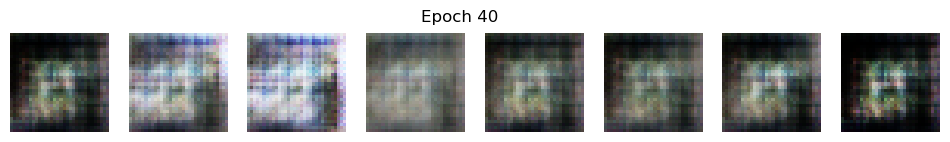

41 [D loss: 0.697444, acc.: 45.42%] [G loss: 0.720812]
42 [D loss: 0.692400, acc.: 48.82%] [G loss: 0.716877]
43 [D loss: 0.694235, acc.: 47.40%] [G loss: 0.718319]
44 [D loss: 0.693273, acc.: 47.30%] [G loss: 0.728874]
45 [D loss: 0.691168, acc.: 49.56%] [G loss: 0.714630]
46 [D loss: 0.689693, acc.: 49.93%] [G loss: 0.728322]
47 [D loss: 0.696556, acc.: 47.28%] [G loss: 0.712826]
48 [D loss: 0.689777, acc.: 48.83%] [G loss: 0.727039]
49 [D loss: 0.692752, acc.: 49.10%] [G loss: 0.719715]
50 [D loss: 0.694084, acc.: 45.95%] [G loss: 0.747021]


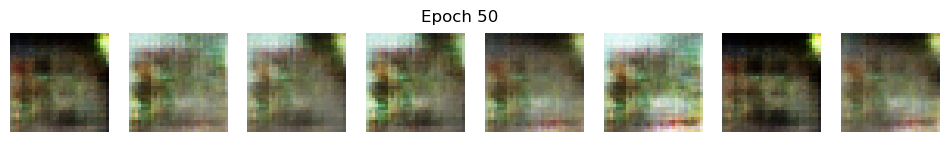

51 [D loss: 0.693626, acc.: 48.15%] [G loss: 0.731903]
52 [D loss: 0.694105, acc.: 49.12%] [G loss: 0.727616]
53 [D loss: 0.697257, acc.: 45.17%] [G loss: 0.736546]
54 [D loss: 0.692400, acc.: 50.54%] [G loss: 0.716665]
55 [D loss: 0.690962, acc.: 49.76%] [G loss: 0.741790]
56 [D loss: 0.692330, acc.: 49.23%] [G loss: 0.721314]
57 [D loss: 0.695636, acc.: 48.49%] [G loss: 0.720276]
58 [D loss: 0.695321, acc.: 48.47%] [G loss: 0.719225]
59 [D loss: 0.695932, acc.: 45.61%] [G loss: 0.728055]


In [44]:
dcgan_v6 = DCGAN_v6(32, 32, 3)
dcgan_v6.train(epochs=60, batch_size=128, save_interval=10)

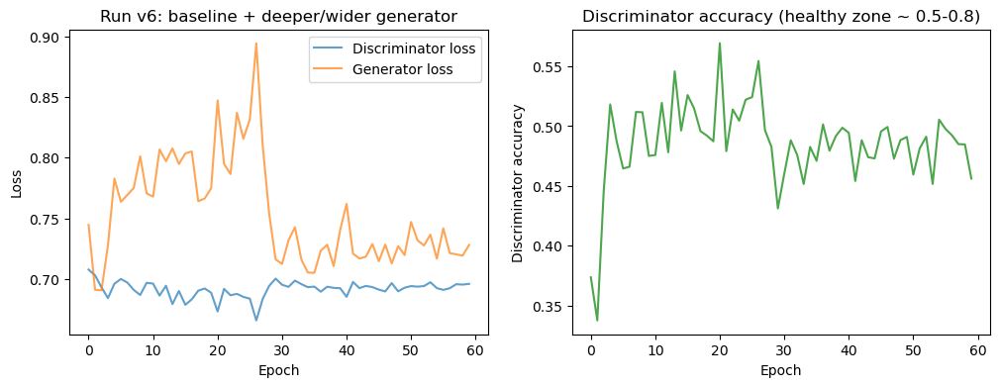

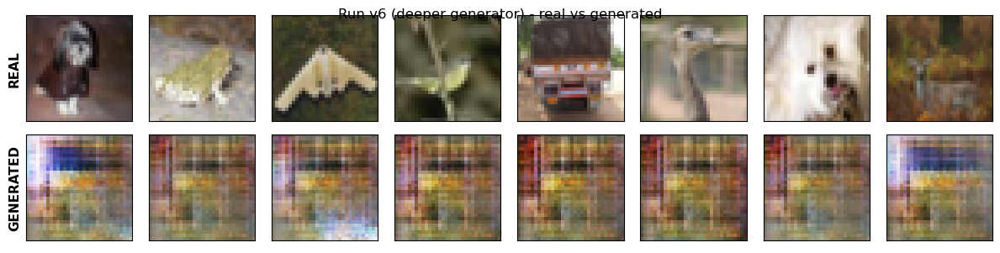

In [45]:
# Evaluate run v6 - same protocol, same seed
dcgan_v6.plot_losses('Run v6: baseline + deeper/wider generator')
dcgan_v6.generator.save_weights('weights/dcgan_v6_generator.h5')

_ = real_vs_fake_grid(dcgan_v6.generator, X_test, title='Run v6 (deeper generator) - real vs generated')

### v6 training interpretation

The loss curves became relatively stable after the early epochs. At epoch 59, discriminator loss was 0.696 and generator loss was 0.728. However, discriminator accuracy was 45.61%, meaning the discriminator was slightly weaker than the generator and could not reliably distinguish real from generated images.

Although the training values appear reasonably stable, the generated images are blurry and highly similar to one another. This shows low diversity and possible mode collapse. Therefore, the deeper and wider generator did not clearly improve image quality over the baseline.

likely reason for mode collapse : Generator is much more powerful than the unchanged discriminator. The deeper/wider generator may find a small set of outputs that can fool the weaker discriminator, rather than learning the full CIFAR-10 distribution.

## Model v7 and v8

The baseline uses `Dropout(0.2)` after each discriminator convolution. These two independent runs isolate that setting: v7 reduces it to `0.1`, while v8 increases it to `0.4`. All other parts of the architecture remain unchanged.

In [17]:
class DCGAN_Dropout(DCGAN):
    """Baseline DCGAN with only the discriminator dropout rate changed."""
    def __init__(self, rows, cols, channels, dropout_rate, run_name, z=100):
        self.dropout_rate = dropout_rate
        self.run_name = run_name
        self.output_dir = f'generated_cifar10_{run_name}'
        super().__init__(rows, cols, channels, z)

    def build_discriminator(self):
        model = Sequential(name=f'Discriminator_{self.run_name}')
        model.add(Conv2D(128, 3, strides=2, input_shape=self.img_shape, padding='same'))
        model.add(ReLU()); model.add(Dropout(self.dropout_rate))
        model.add(Conv2D(128, 3, strides=2, padding='same'))
        model.add(ReLU()); model.add(Dropout(self.dropout_rate))
        model.add(Flatten()); model.add(Dense(1, activation='sigmoid'))
        img = Input(shape=self.img_shape)
        return Model(img, model(img))

    def save_imgs(self, epoch):
        os.makedirs(self.output_dir, exist_ok=True)
        images = self.generator.predict(np.random.normal(0, 1, (25, self.latent_dim)), verbose=0)
        fig, axs = plt.subplots(5, 5, figsize=(6, 6))
        for ax, image in zip(axs.flat, images):
            ax.imshow(image); ax.axis('off')
        fig.savefig(f'{self.output_dir}/epoch_{epoch:03d}.png', bbox_inches='tight')
        plt.close(fig)


Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 8192)              827392    
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 16, 16, 128)      262272    
 ranspose)                                                       
                                                                 
 re_lu_10 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 32, 32, 128)      262272    
 ranspose)                                                       
                                                                 
 re_lu_11 (ReLU)             (None, 32, 32, 128)       0 

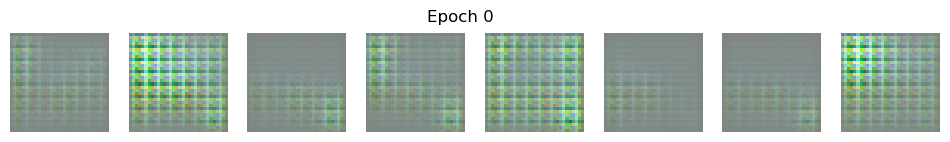

1 [D loss: 0.688260, acc.: 52.65%] [G loss: 0.788986]
2 [D loss: 0.695722, acc.: 48.30%] [G loss: 0.726945]
3 [D loss: 0.685772, acc.: 53.89%] [G loss: 0.741122]
4 [D loss: 0.683751, acc.: 55.87%] [G loss: 0.747468]
5 [D loss: 0.689471, acc.: 51.81%] [G loss: 0.733053]
6 [D loss: 0.690675, acc.: 50.82%] [G loss: 0.717345]
7 [D loss: 0.689126, acc.: 53.25%] [G loss: 0.730595]
8 [D loss: 0.687277, acc.: 54.79%] [G loss: 0.741339]
9 [D loss: 0.689473, acc.: 53.15%] [G loss: 0.736673]
10 [D loss: 0.691082, acc.: 52.17%] [G loss: 0.715007]


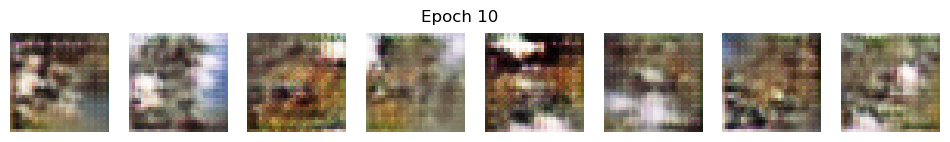

11 [D loss: 0.690407, acc.: 52.38%] [G loss: 0.713402]
12 [D loss: 0.690409, acc.: 51.78%] [G loss: 0.715630]
13 [D loss: 0.691681, acc.: 50.55%] [G loss: 0.708368]
14 [D loss: 0.691387, acc.: 50.51%] [G loss: 0.704917]
15 [D loss: 0.689695, acc.: 52.31%] [G loss: 0.713599]
16 [D loss: 0.689117, acc.: 51.72%] [G loss: 0.713310]
17 [D loss: 0.690520, acc.: 50.94%] [G loss: 0.714581]
18 [D loss: 0.690020, acc.: 50.96%] [G loss: 0.712971]
19 [D loss: 0.692556, acc.: 49.10%] [G loss: 0.709402]
20 [D loss: 0.691560, acc.: 50.01%] [G loss: 0.706480]


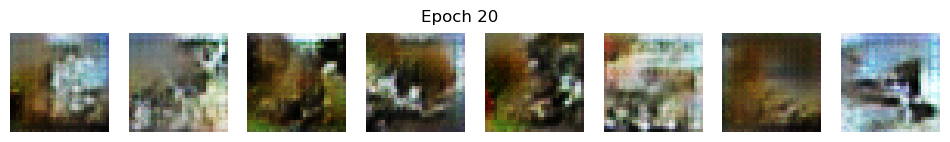

21 [D loss: 0.691982, acc.: 49.58%] [G loss: 0.709481]
22 [D loss: 0.691531, acc.: 49.94%] [G loss: 0.708693]
23 [D loss: 0.691159, acc.: 50.06%] [G loss: 0.711805]
24 [D loss: 0.690495, acc.: 50.34%] [G loss: 0.712649]
25 [D loss: 0.690320, acc.: 50.84%] [G loss: 0.710503]
26 [D loss: 0.690588, acc.: 50.95%] [G loss: 0.714856]
27 [D loss: 0.690270, acc.: 51.16%] [G loss: 0.712980]
28 [D loss: 0.689990, acc.: 51.88%] [G loss: 0.717783]
29 [D loss: 0.689466, acc.: 51.90%] [G loss: 0.714763]
30 [D loss: 0.690436, acc.: 50.61%] [G loss: 0.716417]


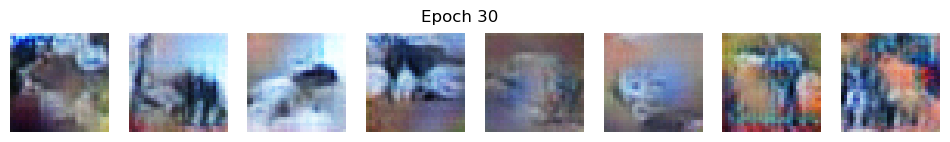

31 [D loss: 0.689788, acc.: 51.26%] [G loss: 0.717701]
32 [D loss: 0.690506, acc.: 50.78%] [G loss: 0.715589]
33 [D loss: 0.689685, acc.: 51.22%] [G loss: 0.715887]
34 [D loss: 0.689981, acc.: 51.33%] [G loss: 0.714826]
35 [D loss: 0.690940, acc.: 50.82%] [G loss: 0.710591]
36 [D loss: 0.690660, acc.: 51.37%] [G loss: 0.708883]
37 [D loss: 0.690986, acc.: 50.97%] [G loss: 0.707883]
38 [D loss: 0.691205, acc.: 50.87%] [G loss: 0.707053]
39 [D loss: 0.691125, acc.: 50.85%] [G loss: 0.707479]
40 [D loss: 0.690918, acc.: 51.39%] [G loss: 0.708287]


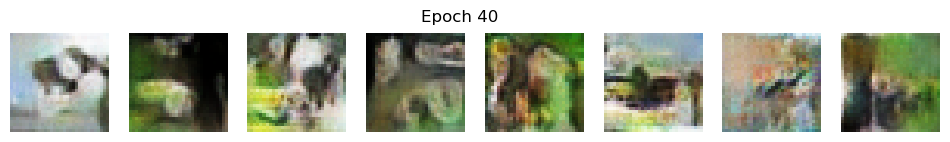

41 [D loss: 0.690965, acc.: 51.64%] [G loss: 0.707001]
42 [D loss: 0.691541, acc.: 50.46%] [G loss: 0.707263]
43 [D loss: 0.690971, acc.: 51.24%] [G loss: 0.708757]
44 [D loss: 0.691575, acc.: 50.74%] [G loss: 0.706976]
45 [D loss: 0.691666, acc.: 50.90%] [G loss: 0.706198]
46 [D loss: 0.691895, acc.: 50.67%] [G loss: 0.706094]
47 [D loss: 0.691613, acc.: 50.78%] [G loss: 0.706162]
48 [D loss: 0.691638, acc.: 50.93%] [G loss: 0.707161]
49 [D loss: 0.691469, acc.: 50.84%] [G loss: 0.705506]
50 [D loss: 0.691599, acc.: 51.00%] [G loss: 0.705113]


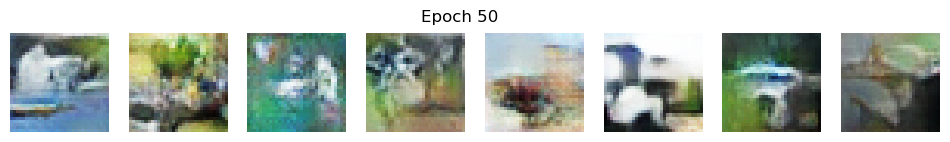

51 [D loss: 0.691674, acc.: 50.98%] [G loss: 0.705740]
52 [D loss: 0.691617, acc.: 51.09%] [G loss: 0.705427]
53 [D loss: 0.691510, acc.: 51.00%] [G loss: 0.705137]
54 [D loss: 0.691589, acc.: 51.04%] [G loss: 0.704745]
55 [D loss: 0.691474, acc.: 50.98%] [G loss: 0.704643]
56 [D loss: 0.691435, acc.: 51.34%] [G loss: 0.704426]
57 [D loss: 0.691209, acc.: 51.36%] [G loss: 0.704034]
58 [D loss: 0.691371, acc.: 50.95%] [G loss: 0.703683]
59 [D loss: 0.691318, acc.: 51.28%] [G loss: 0.704595]


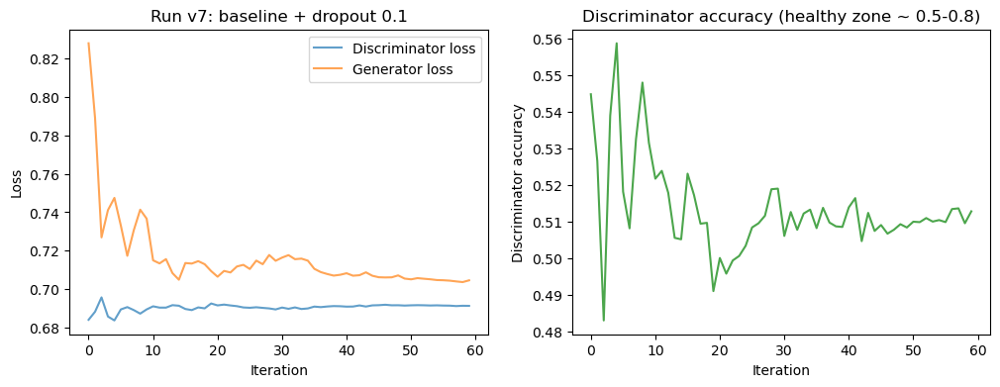

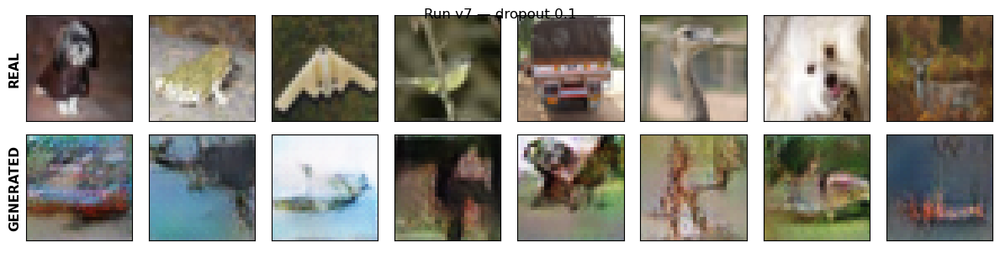

In [15]:
# v7: lower dropout than the 0.2 baseline
dcgan_v7 = DCGAN_Dropout(32, 32, 3, dropout_rate=0.1, run_name='v7')
dcgan_v7.train(epochs=60, batch_size=128, save_interval=10)
dcgan_v7.plot_losses('Run v7: baseline + dropout 0.1')
dcgan_v7.generator.save_weights('weights/dcgan_v7_generator.h5')
_ = real_vs_fake_grid(dcgan_v7.generator, X_test, title='Run v7 — dropout 0.1')

### v7 training interpretation

v7 showed stable and well-balanced training. 

At epoch 59, discriminator accuracy was 51.28%, , while discriminator loss (0.691) and generator loss (0.705) remained stable.

The generated images show more colour variation and diversity than the collapsed models, although they are still blurry and only partly recognisable. Reducing discriminator dropout from 0.2 to 0.1 did not cause either network to dominate, making v7 a stable improvement to consider.

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 8192)              827392    
                                                                 
 reshape_4 (Reshape)         (None, 8, 8, 128)         0         
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 16, 16, 128)      262272    
 ranspose)                                                       
                                                                 
 re_lu_18 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 32, 32, 128)      262272    
 ranspose)                                                       
                                                                 
 re_lu_19 (ReLU)             (None, 32, 32, 128)       0 

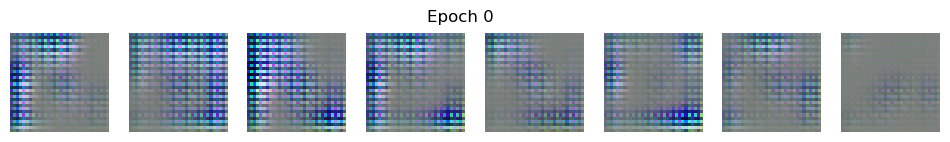

1 [D loss: 0.677406, acc.: 55.99%] [G loss: 0.801224]
2 [D loss: 0.689485, acc.: 52.55%] [G loss: 0.734514]
3 [D loss: 0.681406, acc.: 56.40%] [G loss: 0.766980]
4 [D loss: 0.680059, acc.: 56.16%] [G loss: 0.775173]
5 [D loss: 0.671272, acc.: 57.69%] [G loss: 0.802630]
6 [D loss: 0.676082, acc.: 56.80%] [G loss: 0.804306]
7 [D loss: 0.682306, acc.: 54.32%] [G loss: 0.778119]
8 [D loss: 0.678682, acc.: 56.10%] [G loss: 0.771920]
9 [D loss: 0.672978, acc.: 57.29%] [G loss: 0.806368]
10 [D loss: 0.668816, acc.: 58.24%] [G loss: 0.806718]


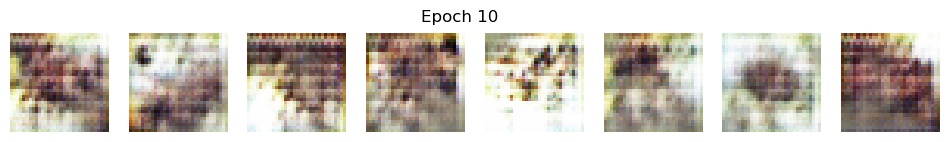

11 [D loss: 0.674065, acc.: 55.75%] [G loss: 0.795767]
12 [D loss: 0.678065, acc.: 55.31%] [G loss: 0.785759]
13 [D loss: 0.693904, acc.: 50.20%] [G loss: 0.751854]
14 [D loss: 0.693885, acc.: 50.18%] [G loss: 0.723621]
15 [D loss: 0.691561, acc.: 51.34%] [G loss: 0.727517]
16 [D loss: 0.693546, acc.: 49.74%] [G loss: 0.717782]
17 [D loss: 0.691333, acc.: 50.78%] [G loss: 0.716450]
18 [D loss: 0.691453, acc.: 50.18%] [G loss: 0.715418]
19 [D loss: 0.690224, acc.: 51.38%] [G loss: 0.708889]
20 [D loss: 0.690177, acc.: 50.94%] [G loss: 0.711819]


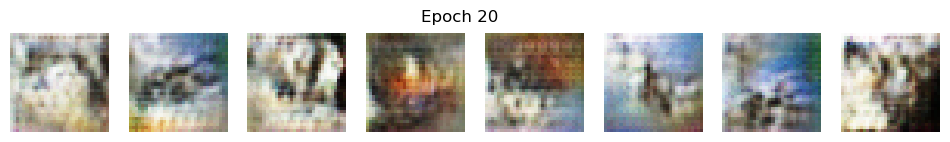

21 [D loss: 0.689010, acc.: 51.71%] [G loss: 0.716118]
22 [D loss: 0.690488, acc.: 51.48%] [G loss: 0.719265]
23 [D loss: 0.691303, acc.: 50.73%] [G loss: 0.711470]
24 [D loss: 0.691487, acc.: 50.60%] [G loss: 0.708552]
25 [D loss: 0.691837, acc.: 49.93%] [G loss: 0.712034]
26 [D loss: 0.690558, acc.: 51.35%] [G loss: 0.712257]
27 [D loss: 0.690966, acc.: 50.11%] [G loss: 0.712721]
28 [D loss: 0.690618, acc.: 51.06%] [G loss: 0.712584]
29 [D loss: 0.689791, acc.: 51.44%] [G loss: 0.714233]
30 [D loss: 0.689059, acc.: 52.07%] [G loss: 0.717938]


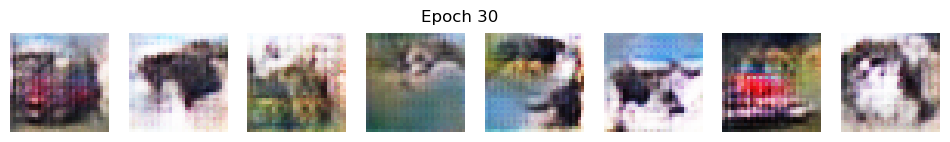

31 [D loss: 0.689507, acc.: 51.96%] [G loss: 0.717991]
32 [D loss: 0.689606, acc.: 51.79%] [G loss: 0.719473]
33 [D loss: 0.690780, acc.: 51.43%] [G loss: 0.715875]
34 [D loss: 0.689579, acc.: 52.01%] [G loss: 0.715916]
35 [D loss: 0.689792, acc.: 51.77%] [G loss: 0.715824]
36 [D loss: 0.688897, acc.: 52.91%] [G loss: 0.713777]
37 [D loss: 0.690289, acc.: 51.33%] [G loss: 0.709287]
38 [D loss: 0.690747, acc.: 51.03%] [G loss: 0.706055]
39 [D loss: 0.691434, acc.: 50.41%] [G loss: 0.702949]
40 [D loss: 0.691627, acc.: 50.50%] [G loss: 0.703964]


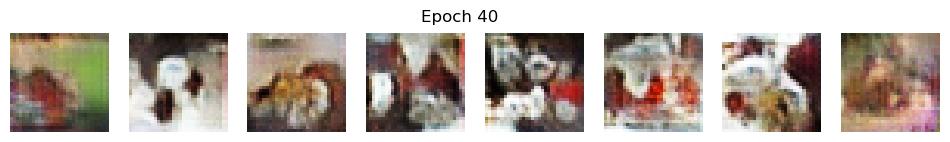

41 [D loss: 0.691818, acc.: 50.55%] [G loss: 0.705762]
42 [D loss: 0.691554, acc.: 50.51%] [G loss: 0.704378]
43 [D loss: 0.691990, acc.: 50.28%] [G loss: 0.703718]
44 [D loss: 0.692033, acc.: 50.48%] [G loss: 0.703483]
45 [D loss: 0.692235, acc.: 50.23%] [G loss: 0.703732]
46 [D loss: 0.692151, acc.: 50.30%] [G loss: 0.704510]
47 [D loss: 0.691890, acc.: 50.54%] [G loss: 0.704619]
48 [D loss: 0.691864, acc.: 51.13%] [G loss: 0.704600]
49 [D loss: 0.691896, acc.: 50.77%] [G loss: 0.702333]
50 [D loss: 0.691746, acc.: 51.33%] [G loss: 0.704718]


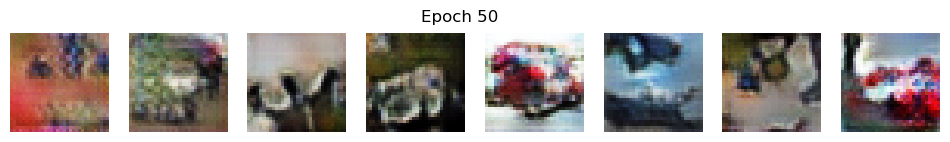

51 [D loss: 0.691453, acc.: 51.33%] [G loss: 0.704115]
52 [D loss: 0.691472, acc.: 51.36%] [G loss: 0.704842]
53 [D loss: 0.691421, acc.: 51.32%] [G loss: 0.702765]
54 [D loss: 0.691435, acc.: 51.33%] [G loss: 0.703487]
55 [D loss: 0.690987, acc.: 51.63%] [G loss: 0.703904]
56 [D loss: 0.691462, acc.: 51.30%] [G loss: 0.702003]
57 [D loss: 0.691336, acc.: 51.25%] [G loss: 0.701875]
58 [D loss: 0.691056, acc.: 51.59%] [G loss: 0.704808]
59 [D loss: 0.691224, acc.: 51.50%] [G loss: 0.703605]


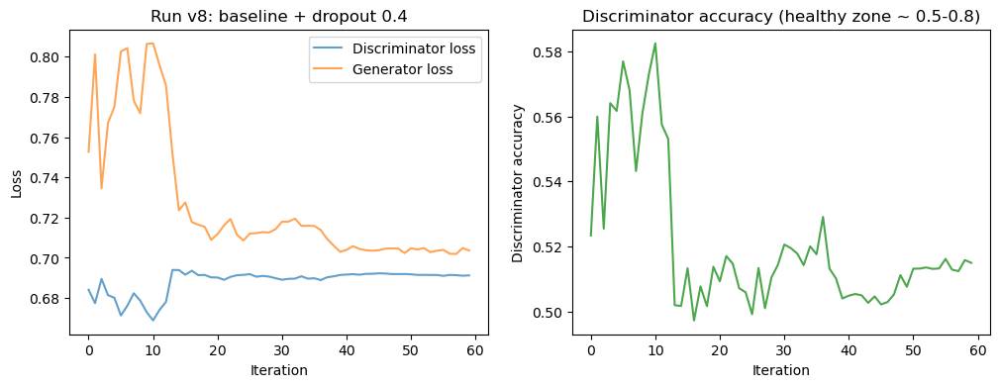

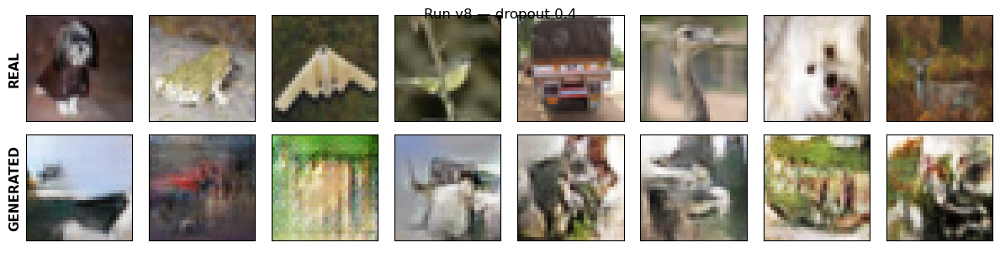

In [17]:
# v8: stronger dropout than the 0.2 baseline
dcgan_v8 = DCGAN_Dropout(32, 32, 3, dropout_rate=0.4, run_name='v8')
dcgan_v8.train(epochs=60, batch_size=128, save_interval=10)
dcgan_v8.plot_losses('Run v8: baseline + dropout 0.4')
dcgan_v8.generator.save_weights('weights/dcgan_v8_generator.h5')
_ = real_vs_fake_grid(dcgan_v8.generator, X_test, title='Run v8 — dropout 0.4')

### v8 training interpretation

v8 showed stable and well-balanced training. At epoch 59, discriminator accuracy was 51.50%, close to random guessing. The discriminator loss (0.691) and generator loss (0.704) were also stable and close to the expected balanced GAN range.

The generated images show reasonable colour variation and rough object-like structures, although they remain blurry. Increasing discriminator dropout from 0.2 to 0.4 did not cause either network to dominate, but by visual quality comparing directly with v1 and v7, the stronger dropout was beneficial.

## Conditional DCGAN experiments (v9, v10)

v9 makes the baseline architecture conditional: it keeps the original two-layer, 128-filter generator and discriminator architecture, adding only learned class-label maps. v10 uses the same conditional generator but replaces the discriminator with v5's deeper/wider 128 → 256 → 512 architecture.

In [18]:
class CDCGAN_Experiment:
    """Conditional DCGAN with a baseline or v5 discriminator backbone."""
    def __init__(self, rows, cols, channels, discriminator_filters, run_name, z=100, num_classes=10):
        self.img_shape, self.latent_dim = (rows, cols, channels), z
        self.num_classes, self.discriminator_filters, self.run_name = num_classes, discriminator_filters, run_name
        self.generator, self.discriminator = self.build_generator(), self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
        # cDCGAN change: both the noise vector and the requested class label are inputs.
        noise, label = Input(shape=(z,)), Input(shape=(1,), dtype='int32')
        fake_img = self.generator([noise, label])
        self.discriminator.trainable = False
        self.combined = Model([noise, label], self.discriminator([fake_img, label]), name=f'{run_name}_combined')
        self.combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))
        self.d_loss_history, self.g_loss_history, self.d_acc_history = [], [], []

    def build_generator(self):
        # cDCGAN change: the generator receives a class label as well as random noise.
        noise, label = Input(shape=(self.latent_dim,)), Input(shape=(1,), dtype='int32')
        # cDCGAN change: turn the class id into a learned 8x8 label map.
        label_map = Embedding(self.num_classes, 50)(label)
        label_map = Reshape((8, 8, 1))(Dense(8 * 8)(Flatten()(label_map)))
        x = Reshape((8, 8, 128))(Dense(128 * 8 * 8, activation='relu')(noise))
        x = Concatenate()([x, label_map])  # cDCGAN change: combine noise features with class information.
        x = ReLU()(Conv2DTranspose(128, (4, 4), strides=2, padding='same')(x))
        x = ReLU()(Conv2DTranspose(128, (4, 4), strides=2, padding='same')(x))
        image = Conv2D(self.img_shape[-1], 7, padding='same', activation='sigmoid')(x)
        return Model([noise, label], image, name=f'{self.run_name}_generator')

    def build_discriminator(self):
        # cDCGAN change: the discriminator receives both an image and its claimed class label.
        image, label = Input(shape=self.img_shape), Input(shape=(1,), dtype='int32')
        # cDCGAN change: turn the label into a 32x32 map to match the input image size.
        label_map = Embedding(self.num_classes, 32 * 32)(label)
        label_map = Reshape((32, 32, 1))(Flatten()(label_map))
        x = Concatenate()([image, label_map])  # cDCGAN change: discriminator sees RGB image + label map.
        for filters in self.discriminator_filters:
            x = Dropout(0.2)(ReLU()(Conv2D(filters, 3, strides=2, padding='same')(x)))
        validity = Dense(1, activation='sigmoid')(Flatten()(x))
        return Model([image, label], validity, name=f'{self.run_name}_discriminator')

    def train(self, epochs, batch_size=128, save_interval=10):
        labels_all = y_train.flatten().astype('int32')
        valid, fake = np.ones((batch_size, 1)), np.zeros((batch_size, 1))
        steps_per_epoch = X_train_scaled.shape[0] // batch_size
        for epoch in range(epochs):
            perm = np.random.permutation(X_train_scaled.shape[0])
            d_losses, g_losses, d_accs = [], [], []
            for step in range(steps_per_epoch):
                idx = perm[step * batch_size:(step + 1) * batch_size]
                # cDCGAN change: real images are paired with their true CIFAR-10 labels.
                real_imgs, real_labels = X_train_scaled[idx], labels_all[idx].reshape(-1, 1)
                # cDCGAN change: randomly choose which class the generator must create.
                fake_labels = np.random.randint(0, self.num_classes, (batch_size, 1))
                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                fake_imgs = self.generator([noise, fake_labels], training=False).numpy()
                d_real = self.discriminator.train_on_batch([real_imgs, real_labels], valid)
                d_fake = self.discriminator.train_on_batch([fake_imgs, fake_labels], fake)
                d_loss = 0.5 * np.add(d_real, d_fake)
                # cDCGAN change: generator is trained to fool the discriminator for these requested labels.
                gen_labels = np.random.randint(0, self.num_classes, (batch_size, 1))
                g_loss = self.combined.train_on_batch([np.random.normal(0, 1, (batch_size, self.latent_dim)), gen_labels], valid)
                d_losses.append(d_loss[0]); d_accs.append(d_loss[1]); g_losses.append(g_loss)
            self.d_loss_history.append(float(np.mean(d_losses)))
            self.g_loss_history.append(float(np.mean(g_losses)))
            self.d_acc_history.append(float(np.mean(d_accs)))
            if epoch % save_interval == 0 or epoch == epochs - 1:
                print(f'{epoch} [D loss: {self.d_loss_history[-1]:.4f}, acc.: {100*self.d_acc_history[-1]:.2f}%] [G loss: {self.g_loss_history[-1]:.4f}]')
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        out_dir = f'generated_cifar10_{self.run_name}'; os.makedirs(out_dir, exist_ok=True)
        labels = np.repeat(np.arange(self.num_classes), 2).reshape(-1, 1)
        images = self.generator.predict([np.random.normal(0, 1, (len(labels), self.latent_dim)), labels], verbose=0)
        fig, axs = plt.subplots(2, self.num_classes, figsize=(15, 3))
        for i, ax in enumerate(axs.flat):
            ax.imshow(images[i]); ax.axis('off')
            if i < self.num_classes: ax.set_title(class_names[i], fontsize=8)
        fig.suptitle(f'{self.run_name} — epoch {epoch}')
        plt.tight_layout()
        fig.savefig(f'{out_dir}/epoch_{epoch:03d}.png', bbox_inches='tight')
        plt.show()
        plt.close(fig)

    def plot_losses(self, title):
        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].plot(self.d_loss_history, label='Discriminator'); axs[0].plot(self.g_loss_history, label='Generator')
        axs[0].set(title=title, xlabel='Epoch', ylabel='Loss'); axs[0].legend()
        axs[1].plot(self.d_acc_history, color='green'); axs[1].set(title='Discriminator accuracy', xlabel='Epoch', ylabel='Accuracy')
        plt.show()


0 [D loss: 0.6735, acc.: 55.18%] [G loss: 0.9023]


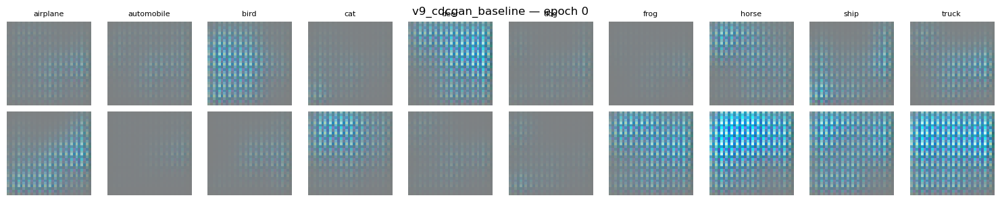

10 [D loss: 0.6894, acc.: 52.56%] [G loss: 0.7191]


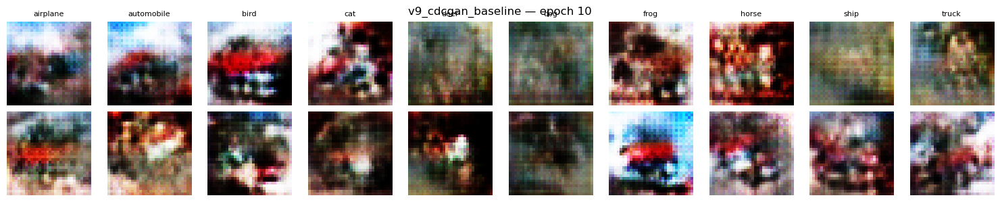

20 [D loss: 0.6871, acc.: 54.71%] [G loss: 0.7174]


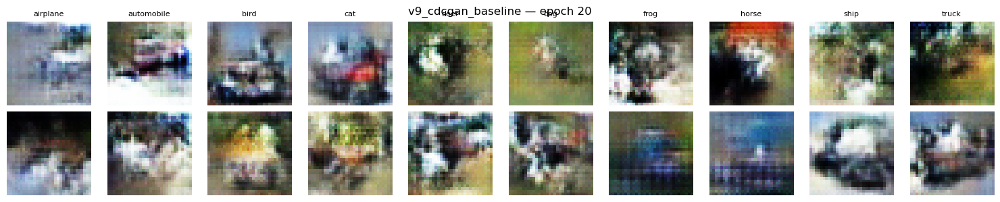

30 [D loss: 0.6873, acc.: 53.78%] [G loss: 0.7137]


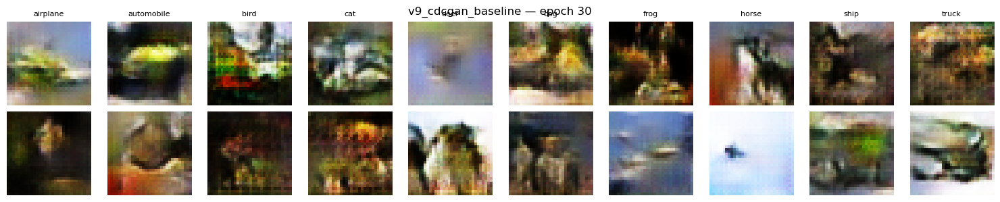

40 [D loss: 0.6868, acc.: 54.09%] [G loss: 0.7151]


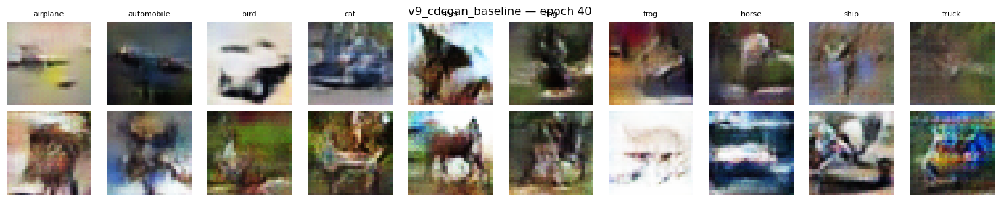

50 [D loss: 0.6865, acc.: 54.20%] [G loss: 0.7147]


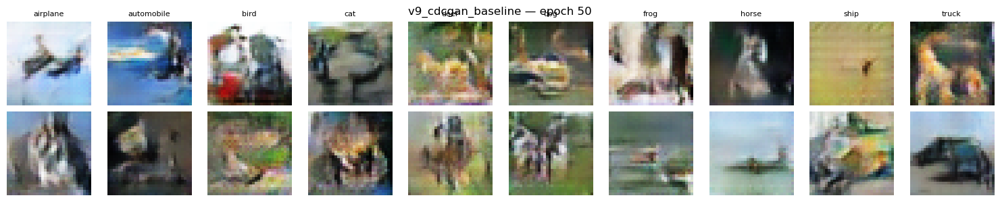

59 [D loss: 0.6858, acc.: 54.61%] [G loss: 0.7160]


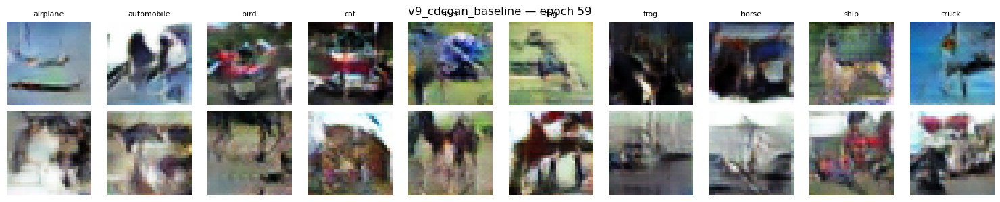

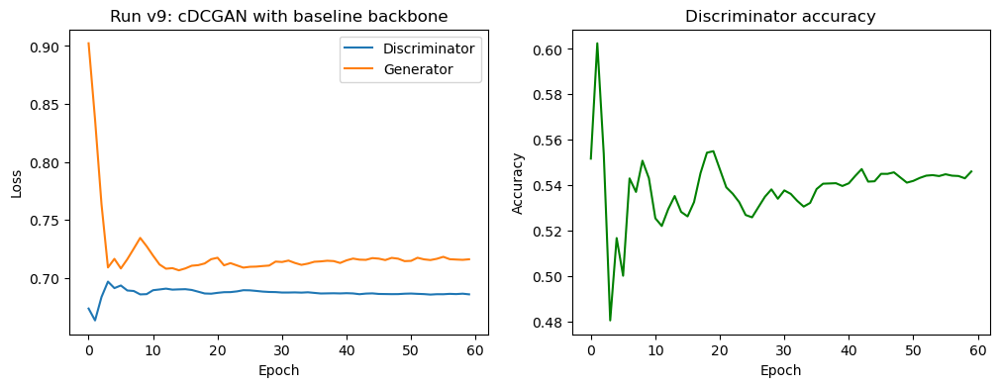

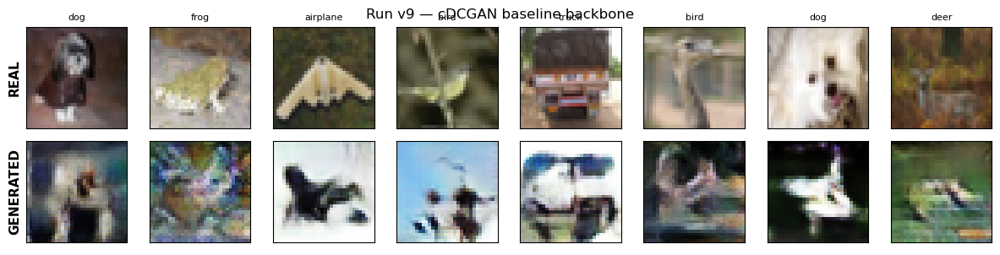

In [25]:
# v9: conditional version of the baseline architecture (two 128-filter discriminator blocks)
cdcgan_v9 = CDCGAN_Experiment(32, 32, 3, discriminator_filters=(128, 128), run_name='v9')
cdcgan_v9.train(epochs=60, batch_size=128, save_interval=10)
cdcgan_v9.plot_losses('Run v9: cDCGAN with baseline backbone')
cdcgan_v9.generator.save_weights('weights/dcgan_v9_generator.h5')
_ = real_vs_fake_grid(cdcgan_v9.generator, X_test, real_labels=y_test, class_names=class_names, title='Run v9 — cDCGAN baseline backbone')

### v9 training interpretation

v9 showed stable and well-balanced cDCGAN training. At epoch 59, discriminator accuracy was 54.61%, meaning it was only slightly stronger than the generator. The discriminator loss (0.686) and generator loss (0.716) were stable throughout the later epochs.

The generated images show colour variation and rough object-like structures. Because the model is conditional, each generated image is linked to a requested class label. Although the images are still blurry, v9 provides a stable baseline conditional model for comparison with v10.

0 [D loss: 0.5045, acc.: 73.96%] [G loss: 1.6378]


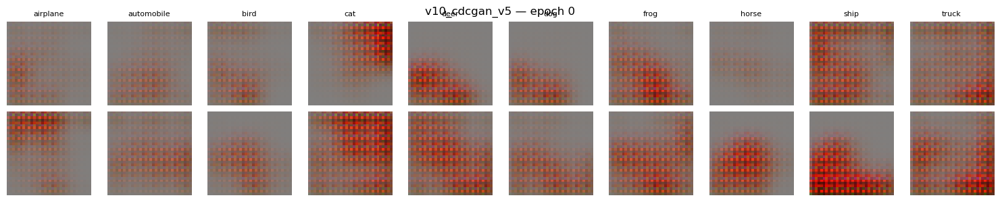

10 [D loss: 0.6051, acc.: 67.49%] [G loss: 1.0642]


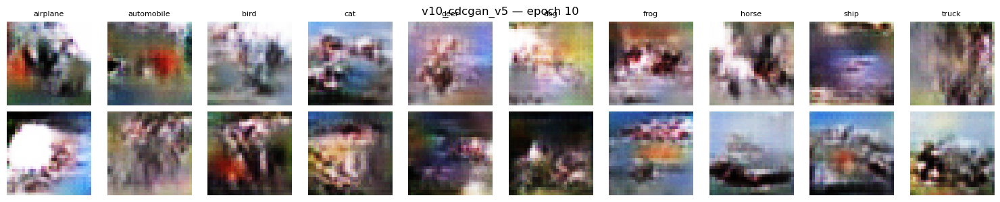

20 [D loss: 0.6203, acc.: 65.00%] [G loss: 0.9516]


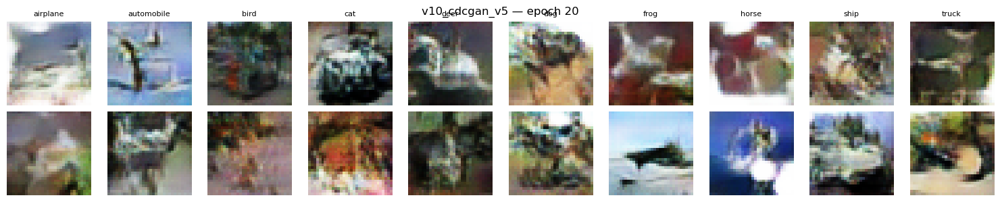

30 [D loss: 0.6109, acc.: 66.11%] [G loss: 0.9516]


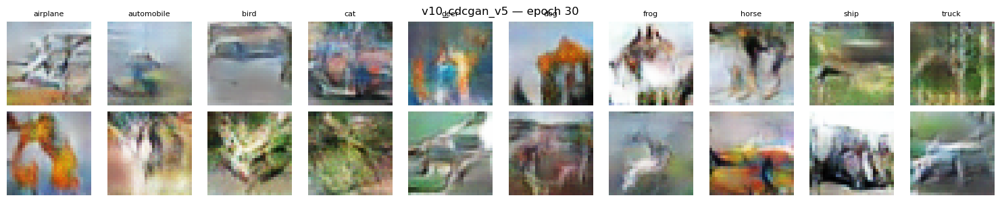

40 [D loss: 0.5788, acc.: 69.20%] [G loss: 1.0606]


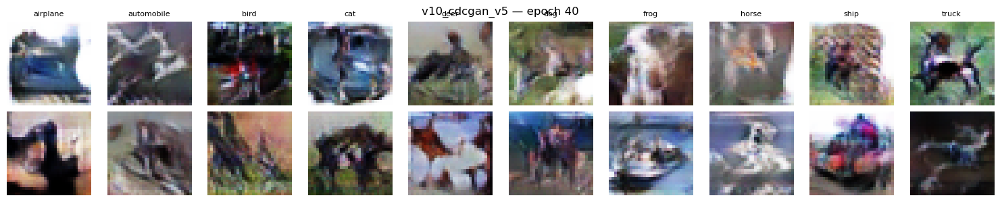

50 [D loss: 0.5408, acc.: 72.53%] [G loss: 1.1876]


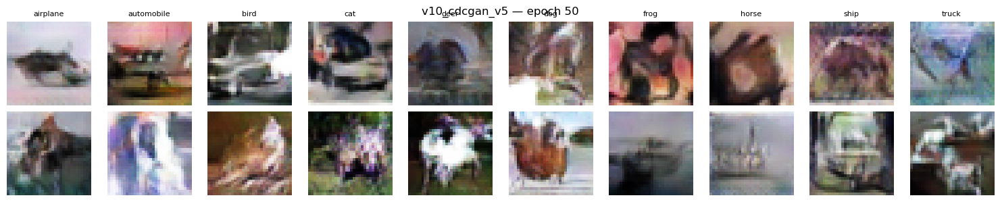

59 [D loss: 0.5070, acc.: 75.08%] [G loss: 1.3180]


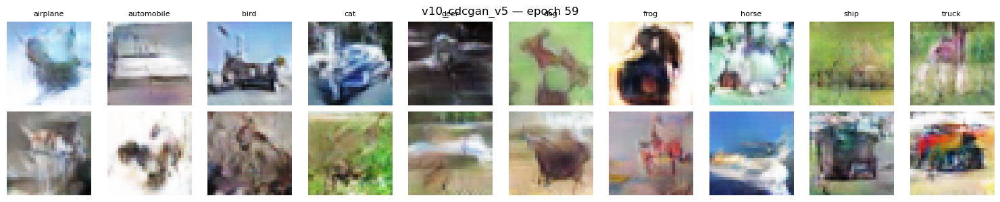

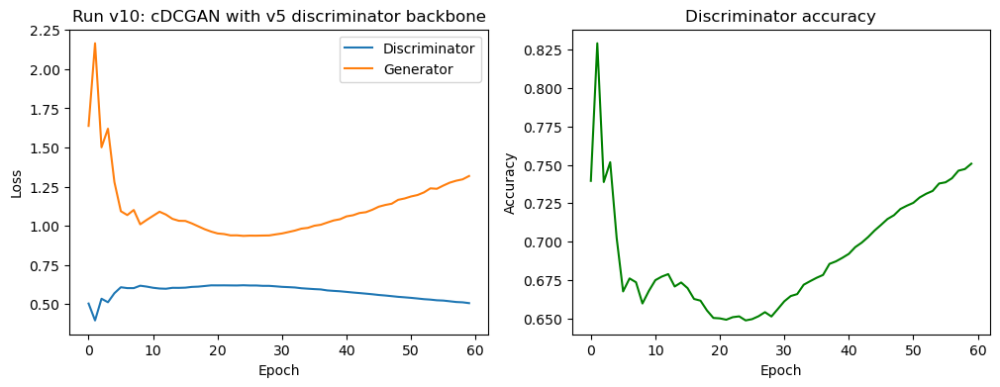

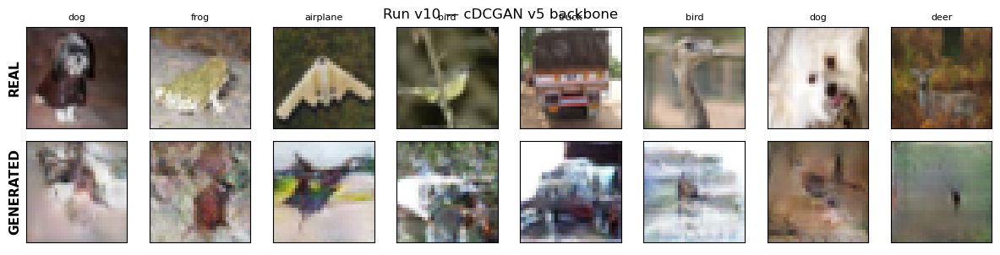

In [26]:
# v10: conditional model with v5's deeper/wider discriminator (128 → 256 → 512)
cdcgan_v10 = CDCGAN_Experiment(32, 32, 3, discriminator_filters=(128, 256, 512), run_name='v10')
cdcgan_v10.train(epochs=60, batch_size=128, save_interval=10)
cdcgan_v10.plot_losses('Run v10: cDCGAN with v5 discriminator backbone')
cdcgan_v10.generator.save_weights('weights/dcgan_v10_generator.h5')
_ = real_vs_fake_grid(cdcgan_v10.generator, X_test, real_labels=y_test, class_names=class_names, title='Run v10 — cDCGAN v5 backbone')

### v10 training interpretation

v10 became increasingly unbalanced during training. By epoch 59, discriminator accuracy had risen to 75.08%, while discriminator loss fell to 0.507 and generator loss increased to 1.318. This shows that the deeper v5 discriminator was becoming too strong for the generator.

The generated images still show some colour and object-like patterns, but they remain blurry and the rising generator loss suggests that training was becoming less stable. Compared with v9, v10’s larger discriminator did not improve training balance. Howeve by visual quality it is still not too bad.

## Side-by-side generated-image comparison

Each row shows images from one model. Every model uses the same fixed noise seed; v9 and v10 use class labels 0-7.

Load model weights

In [20]:
# v1–v6
dcgan_v1 = DCGAN(32, 32, 3)
dcgan_v1.generator.load_weights('weights/dcgan_v1_baseline_60_generator.h5')

dcgan_v2 = DCGAN_v2(32, 32, 3)
dcgan_v2.generator.load_weights('weights/dcgan_v2_generator.h5')

dcgan_v3 = DCGAN_v3(32, 32, 3)
dcgan_v3.generator.load_weights('weights/dcgan_v3_generator.h5')

dcgan_v4 = DCGAN_v4(32, 32, 3)
dcgan_v4.generator.load_weights('weights/dcgan_v4_generator.h5')

dcgan_v5 = DCGAN_v5(32, 32, 3)
dcgan_v5.generator.load_weights('weights/dcgan_v5_generator.h5')

dcgan_v6 = DCGAN_v6(32, 32, 3)
dcgan_v6.generator.load_weights('weights/dcgan_v6_generator.h5')

# v7–v8
dcgan_v7 = DCGAN_Dropout(32, 32, 3, dropout_rate=0.1, run_name='v7')
dcgan_v7.generator.load_weights('weights/dcgan_v7_generator.h5')

dcgan_v8 = DCGAN_Dropout(32, 32, 3, dropout_rate=0.4, run_name='v8')
dcgan_v8.generator.load_weights('weights/dcgan_v8_generator.h5')

# v9–v10
cdcgan_v9 = CDCGAN_Experiment(
    32, 32, 3, discriminator_filters=(128, 128),
    run_name='v9'
)
cdcgan_v9.generator.load_weights('weights/dcgan_v9_generator.h5')

cdcgan_v10 = CDCGAN_Experiment(
    32, 32, 3, discriminator_filters=(128, 256, 512),
    run_name='v10'
)
cdcgan_v10.generator.load_weights('weights/dcgan_v10_generator.h5')

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_35 (Conv2D)          (None, 16, 16, 128)       3584      
                                                                 
 re_lu_47 (ReLU)             (None, 16, 16, 128)       0         
                                                                 
 dropout_24 (Dropout)        (None, 16, 16, 128)       0         
                                                                 
 conv2d_36 (Conv2D)          (None, 8, 8, 128)         147584    
                                                                 
 re_lu_48 (ReLU)             (None, 8, 8, 128)         0         
                                                                 
 dropout_25 (Dropout)        (None, 8, 8, 128)         0         
                                                                 
 flatten_15 (Flatten)        (None, 8192)            

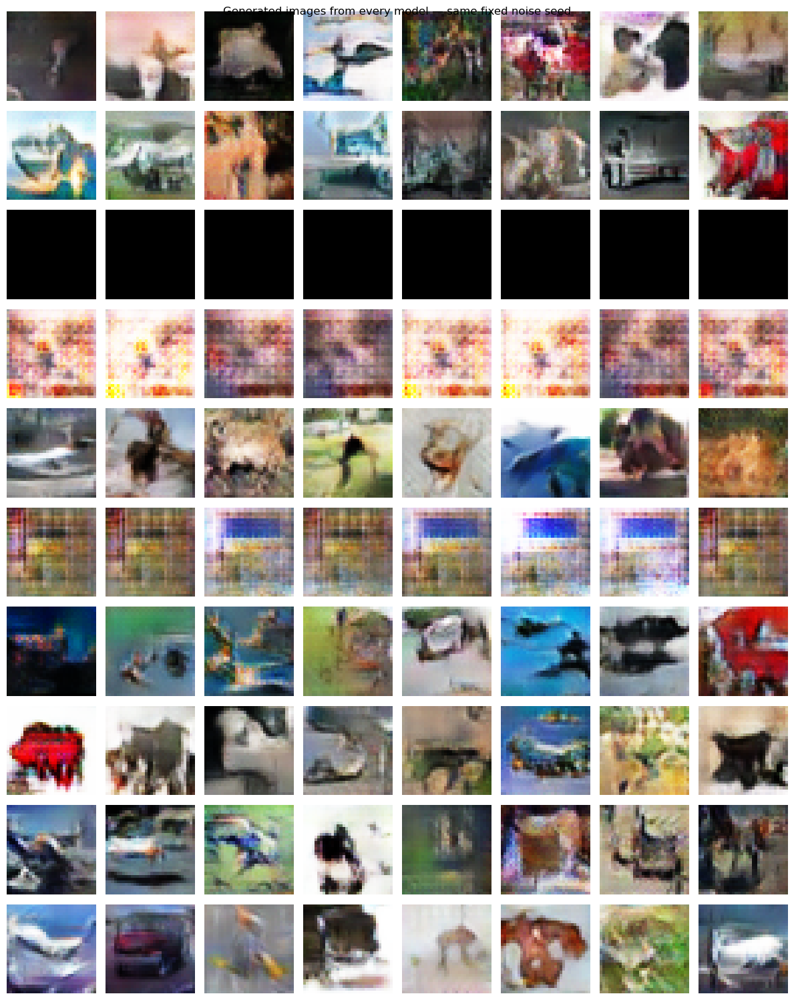

In [21]:
models = [dcgan_v1, dcgan_v2, dcgan_v3, dcgan_v4, dcgan_v5,
          dcgan_v6, dcgan_v7, dcgan_v8, cdcgan_v9, cdcgan_v10]
names = ['v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9', 'v10']

np.random.seed(2026)
noise = np.random.normal(0, 1, (8, 100)).astype('float32')
labels = np.arange(8, dtype='int32').reshape(-1, 1)

fig, axes = plt.subplots(10, 8, figsize=(12, 15))
for row in range(10):
    if row < 8:
        images = models[row].generator(noise, training=False).numpy()
    else:
        images = models[row].generator([noise, labels], training=False).numpy()

    for col in range(8):
        axes[row, col].imshow(np.clip(images[col], 0, 1))
        axes[row, col].axis('off')
    axes[row, 0].set_ylabel(names[row], rotation=0, labelpad=25, va='center', fontsize=10)

fig.suptitle('Generated images from every model — same fixed noise seed', y=0.995)
plt.tight_layout()
plt.savefig('all_models_side_by_side.png', dpi=150, bbox_inches='tight')
plt.show()


### Eye-power evaluation

A visual comparison was conducted using the same fixed noise seed for every model. The generated images were compared against real CIFAR-10 test images based on colour, object-like structure, sharpness, and diversity.

Models v5 and v10 appear to produce the strongest generated images in this visual test. Their samples show more distinct shapes, stronger colour patterns, and greater variation than most of the other models. In comparison, v3 produced near-black images, while v4 and v6 showed more repetitive or checkerboard-like patterns.

However, the images from v5 and v10 are still blurry due to the low 32×32 CIFAR-10 resolution. 

These results can be later used along with FID to decide on the best model

In [22]:
# FID comparison. Every model is compared with the same 1,000 held-out test images.
# The first run may download InceptionV3 ImageNet weights.
from scipy.linalg import sqrtm
import pandas as pd

FID_SAMPLES = 1000
FID_BATCH_SIZE = 50

# Generate 1,000 fake images from one model. Conditional models also receive class labels.
def make_fake_images(generator, conditional=False):
    np.random.seed(2026)  # Use the same noise for every model so the comparison is fair.
    all_images = []
    for start in range(0, FID_SAMPLES, FID_BATCH_SIZE):
        noise = np.random.normal(0, 1, (FID_BATCH_SIZE, 100)).astype('float32')  # Random generator input.
        if conditional:
            labels = (np.arange(start, start + FID_BATCH_SIZE) % 10).astype('int32').reshape(-1, 1)  # Balanced labels 0-9.
            images = generator([noise, labels], training=False).numpy()
        else:
            images = generator(noise, training=False).numpy()
        all_images.append(np.clip(images * 255, 0, 255).astype('float32'))  # Convert generator output [0,1] to [0,255].
    return np.concatenate(all_images)

# Convert images into feature vectors using pretrained InceptionV3.
def get_features(inception, images):
    all_features = []
    for start in range(0, len(images), FID_BATCH_SIZE):
        batch = tf.image.resize(images[start:start + FID_BATCH_SIZE], (299, 299))  # InceptionV3 expects 299x299 images.
        batch = tf.keras.applications.inception_v3.preprocess_input(batch)  # Apply InceptionV3 input scaling.
        all_features.append(inception.predict(batch, verbose=0))
    return np.concatenate(all_features)

# Calculate FID from the real and generated Inception feature distributions. Lower is better.
def fid_score(real_features, fake_images, inception):
    fake_features = get_features(inception, fake_images)
    mu_real, mu_fake = real_features.mean(axis=0), fake_features.mean(axis=0)
    sigma_real = np.cov(real_features, rowvar=False)
    sigma_fake = np.cov(fake_features, rowvar=False)
    covmean = sqrtm(sigma_real @ sigma_fake)  # Matrix term required by the FID formula.
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    difference = mu_real - mu_fake
    return float(difference @ difference + np.trace(sigma_real + sigma_fake - 2 * covmean))

np.random.seed(2026)
real_images = X_test[np.random.choice(len(X_test), FID_SAMPLES, replace=False)].astype('float32')  # Same held-out real images for every model.
inception = tf.keras.applications.InceptionV3(include_top=False, pooling='avg', weights='imagenet')  # Pretrained feature extractor; it does not train the GAN.
real_features = get_features(inception, real_images)  # Compute once, then reuse for every model.

# v1-v8 are ordinary DCGANs; v9-v10 are conditional DCGANs.
fid_v1 = fid_score(real_features, make_fake_images(dcgan_v1.generator), inception)
fid_v2 = fid_score(real_features, make_fake_images(dcgan_v2.generator), inception)
fid_v3 = fid_score(real_features, make_fake_images(dcgan_v3.generator), inception)
fid_v4 = fid_score(real_features, make_fake_images(dcgan_v4.generator), inception)
fid_v5 = fid_score(real_features, make_fake_images(dcgan_v5.generator), inception)
fid_v6 = fid_score(real_features, make_fake_images(dcgan_v6.generator), inception)
fid_v7 = fid_score(real_features, make_fake_images(dcgan_v7.generator), inception)
fid_v8 = fid_score(real_features, make_fake_images(dcgan_v8.generator), inception)
fid_v9 = fid_score(real_features, make_fake_images(cdcgan_v9.generator, conditional=True), inception) 
fid_v10 = fid_score(real_features, make_fake_images(cdcgan_v10.generator, conditional=True), inception)

# Put scores into a table and sort: lower FID means better generated-image quality.
fid_results = pd.DataFrame([
    ['v1', fid_v1], ['v2', fid_v2], ['v3', fid_v3], ['v4', fid_v4], ['v5', fid_v5],
    ['v6', fid_v6], ['v7', fid_v7], ['v8', fid_v8], ['v9', fid_v9], ['v10', fid_v10],
], columns=['Model', 'FID']).sort_values('FID')

display(fid_results)


,Model,FID
4,v5,86.231084
9,v10,96.464762
6,v7,105.039859
7,v8,107.408991
0,v1,108.117613
1,v2,112.881563
8,v9,123.646833
3,v4,312.210338
5,v6,369.993529
2,v3,601.759896


### FID evaluation and final model selection

FID was used to quantitatively compare the generated-image distributions against the held-out CIFAR-10 test images. A lower FID score indicates that the generated images are more similar to real CIFAR-10 images.

The FID results support the findings from the eye-power evaluation. Model v5 achieved the lowest FID score, followed by v10. This confirms that v5 produced the generated images most similar to the real CIFAR-10 distribution among the tested models.

Therefore, v5 was selected as the final model and will be used to generate the final 1,000 images.

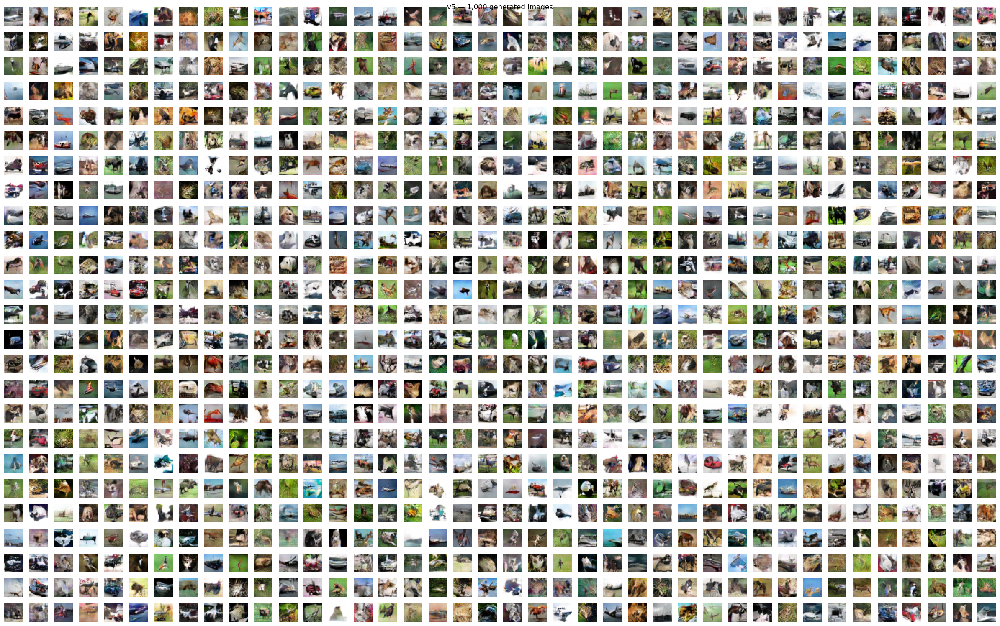

In [23]:
# Generate, save and display the final 1,000 images from v5. No retraining is performed.
import os

output_dir = 'generated_images_final'
os.makedirs(output_dir, exist_ok=True)

np.random.seed(2026)
noise = np.random.normal(0, 1, (1000, 100)).astype('float32')
images = dcgan_v5.generator(noise, training=False).numpy()

for index in range(1000):
    plt.imsave(f'{output_dir}/generated_{index:04d}.png', np.clip(images[index], 0, 1))

fig, axes = plt.subplots(25, 40, figsize=(24, 15))
for index, ax in enumerate(axes.flat):
    ax.imshow(np.clip(images[index], 0, 1))
    ax.axis('off')

fig.suptitle('v5 — 1,000 generated images', y=0.995)
plt.tight_layout()
plt.show()


## Conclusion

This project used CIFAR-10 to build and systematically compare DCGAN and conditional DCGAN models for image generation. The experiments examined training duration, learning rate, Batch Normalisation, denser discriminator and generator layers, dropout, and conditional class based generation.

The models were evaluated using training losses, discriminator accuracy, an eye-power comparison, and FID. These measures were used together because loss values alone do not fully represent generated-image quality.

Model v5 produced the strongest overall results. It generated the most visually convincing and varied samples in the eye-power comparison and achieved the lowest FID score. Although v10 was also visually promising, its discriminator became too strong during training.

Therefore, v5 was selected as the final model. Its saved generator weights were used to produce the final 1,000 CIFAR-10 images for submission.